Diagnostics & Prognostics framework

# Problem Statement
Machine Learning based Data Driven Diagnostics & Prognostics framework having libraries for following 5 stages:

1. Data preprocessing + Feature Engineering, 
2. Anamoly detection, 
3. Enhanced fault isolation, 
4. Fault identification,
5. Prognostics.

Demonstrate framework using NASA Simulated turbofan engine dataset and Battery dataset

This Framework will have following features:

1. Multiple libraries for various steps having probition for benchmarking with KPI’s
2. Front end Jupyter notebook comments, reconfiguration, guidens 
3. Python packages
4. Framework should demonstrate more than one use case

# About Dataset

Data Set: FD001  
Train trjectories: 100  
Test trajectories: 100  
Conditions: ONE (Sea Level)  
Fault Modes: ONE (HPC Degradation)  

Datasets include simulations of multiple turbofan engines over time, each row contains the following information:
1. Engine unit number
2. Time, in cycles
3. Three operational settings
4. 21 sensor readings

<span class="mark">Schematic representation of the CMAPSS model as depicted in the CMAPSS documentation</span>

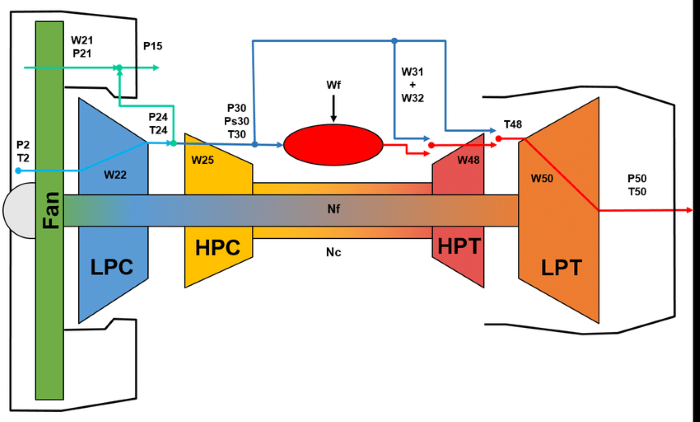

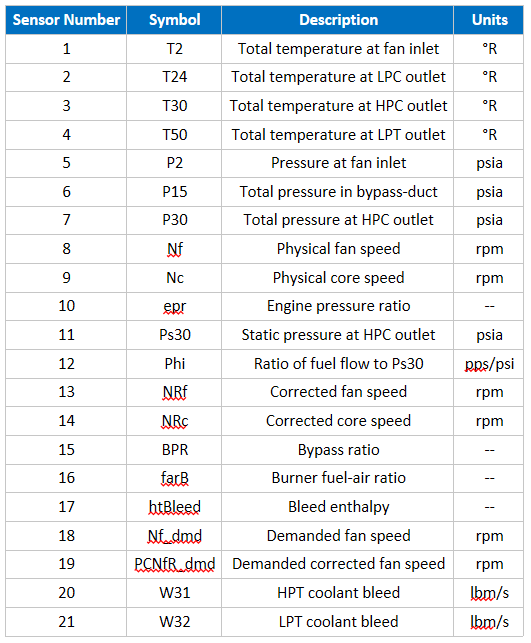

<span class="mark">Source</span>: Aircraft Engine Run-to-Failure Dataset under Real Flight Conditions for Prognostics and Diagnostics by Manuel Arias Chao, Chetan Kulkarni, Kai Goebel and Olga Fink

# Data Loading

In [1]:
# Import needed libraries

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from math import sqrt

from sklearn.feature_selection import SelectKBest, RFE
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, accuracy_score, mean_absolute_percentage_error, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.cluster import KMeans
from sklearn.tree import DecisionTreeRegressor


import warnings
warnings.filterwarnings('ignore')

In [2]:
# Creating an array with the actual feature names in the dataset
index_names = ['unit number', 'Cycle Time']
setting_names = ['Altitude', 'Mach Number', 'TRA']
sensor_names = [
    'Total temperature at fan inlet', 'Total temperature at LPC outlet',
    'Total temperature at HPC outlet', 'Total temperature at LPT outlet',
    'Pressure at fan inlet', 'Total pressure in bypass-duct',
    'Total pressure at HPC outlet', 'Physical fan speed',
    'Physical core speed', 'Engine pressure ratio',
    'Static pressure at HPC outlet', 'Ratio of fuel flow to Ps30',
    'Corrected fan speed', 'Corrected core speed', 'Bypass ratio',
    'Burner fuel-air ratio', 'Bleed enthalpy', 'Demanded fan speed',
    'Demanded corrected fan speed', 'HPT coolant bleed', 'LPT coolant bleed'
]
col_names = index_names + setting_names + sensor_names

In [3]:
def processFirstDataSet():
    print("Data Set FD001 Execution")
    train = pd.read_csv('dataset/train_FD001.txt', sep='\s+', header=None, names=col_names)
    test = pd.read_csv('dataset/test_FD001.txt', sep='\s+', header=None, names=col_names)
    test_results = pd.read_csv('dataset/RUL_FD001.txt', sep='\s+', header=None, names=['RUL'])
    return train, test, test_results

In [4]:
def processSecondDataSet():
    print("Data Set FD002 Execution")
    train = pd.read_csv('dataset/train_FD002.txt', sep='\s+', header=None, names=col_names)
    test = pd.read_csv('dataset/test_FD002.txt', sep='\s+', header=None, names=col_names)
    test_results = pd.read_csv('dataset/RUL_FD002.txt', sep='\s+', header=None, names=['RUL'])
    return train, test, test_results

In [5]:
def processThirdDataSet():
    print("Data Set FD003 Execution")
    train = pd.read_csv('dataset/train_FD003.txt', sep='\s+', header=None, names=col_names)
    test = pd.read_csv('dataset/test_FD003.txt', sep='\s+', header=None, names=col_names)
    test_results = pd.read_csv('dataset/RUL_FD003.txt', sep='\s+', header=None, names=['RUL'])
    return train, test, test_results

In [6]:
def processFourthDataSet():
    print("Data Set FD004 Execution")
    train = pd.read_csv('dataset/train_FD004.txt', sep='\s+', header=None, names=col_names)
    test = pd.read_csv('dataset/test_FD004.txt', sep='\s+', header=None, names=col_names)
    test_results = pd.read_csv('dataset/RUL_FD004.txt', sep='\s+', header=None, names=['RUL'])
    return train, test, test_results

In [7]:
def errorHandlerForDataSet():
    return "Please Enter the Valid Options: "

In [8]:
print('''
Please Enter 1 for Execution of First Data Set
Please Enter 2 for Execution of Second Data Set
Please Enter 3 for Execution of Third Data Set
Please Enter 4 for Execution of Fourth Data Set
''')


Please Enter 1 for Execution of First Data Set
Please Enter 2 for Execution of Second Data Set
Please Enter 3 for Execution of Third Data Set
Please Enter 4 for Execution of Fourth Data Set



In [9]:
choice = int(input("Please Enter the Data Set you want to Execute  :"))

Please Enter the Data Set you want to Execute  :1


In [10]:
datasetlist = [processFirstDataSet, processSecondDataSet, processThirdDataSet, processFourthDataSet,errorHandlerForDataSet]

In [11]:
output = datasetlist[choice - 1]()

Data Set FD001 Execution


In [12]:
for df in output:
    df_train = output[0]
    df_test  = output[1]
    df_RUL = output[2]
    break

In [13]:
df_train

,unit number,Cycle Time,Altitude,Mach Number,TRA,Total temperature at fan inlet,Total temperature at LPC outlet,Total temperature at HPC outlet,Total temperature at LPT outlet,Pressure at fan inlet,...,Ratio of fuel flow to Ps30,Corrected fan speed,Corrected core speed,Bypass ratio,Burner fuel-air ratio,Bleed enthalpy,Demanded fan speed,Demanded corrected fan speed,HPT coolant bleed,LPT coolant bleed
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,14.62,...,519.49,2388.26,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735
20627,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,...,519.68,2388.22,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594
20628,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,...,520.01,2388.24,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333
20629,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,...,519.67,2388.23,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640


In [14]:
# drop the empty columns in both train & test data set
df_train = df_train.dropna(axis='columns')
df_test = df_test.dropna(axis='columns')

df_train.head()

,unit number,Cycle Time,Altitude,Mach Number,TRA,Total temperature at fan inlet,Total temperature at LPC outlet,Total temperature at HPC outlet,Total temperature at LPT outlet,Pressure at fan inlet,...,Ratio of fuel flow to Ps30,Corrected fan speed,Corrected core speed,Bypass ratio,Burner fuel-air ratio,Bleed enthalpy,Demanded fan speed,Demanded corrected fan speed,HPT coolant bleed,LPT coolant bleed
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044


In [15]:
# RUL data frame
df_RUL

,RUL
0,112
1,98
2,69
3,82
4,91
...,...
95,137
96,82
97,59
98,117


## Compute target variable (RUL)

### for train data

<span class="mark">RUL = EOL - Cycle Time</span>

RUL - Remaining Useful Life

EOL - End of Life

In [16]:
# 1. Get the End of life
EOL = []
for sl_no in df_train["unit number"]:
    EOL.append(((
        df_train[df_train["unit number"] == sl_no]["Cycle Time"]).values)[-1])

In [17]:
# add EOL to the train data set
df_train["Max Cycle"] = EOL
df_train

,unit number,Cycle Time,Altitude,Mach Number,TRA,Total temperature at fan inlet,Total temperature at LPC outlet,Total temperature at HPC outlet,Total temperature at LPT outlet,Pressure at fan inlet,...,Corrected fan speed,Corrected core speed,Bypass ratio,Burner fuel-air ratio,Bleed enthalpy,Demanded fan speed,Demanded corrected fan speed,HPT coolant bleed,LPT coolant bleed,Max Cycle
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190,192
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,192
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,192
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,192
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,192
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,14.62,...,2388.26,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735,200
20627,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,...,2388.22,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594,200
20628,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,...,2388.24,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333,200
20629,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,...,2388.23,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640,200


In [18]:
# calculate RUL & add to the train data set
df_train["RUL"] = df_train["Max Cycle"] - df_train["Cycle Time"]

# drop the EOL column as it is not necessary
#df_train = df_train.drop(columns=['EOL'])
df_train

,unit number,Cycle Time,Altitude,Mach Number,TRA,Total temperature at fan inlet,Total temperature at LPC outlet,Total temperature at HPC outlet,Total temperature at LPT outlet,Pressure at fan inlet,...,Corrected core speed,Bypass ratio,Burner fuel-air ratio,Bleed enthalpy,Demanded fan speed,Demanded corrected fan speed,HPT coolant bleed,LPT coolant bleed,Max Cycle,RUL
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190,192,191
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,192,190
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,192,189
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,192,188
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,192,187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,14.62,...,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735,200,4
20627,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,...,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594,200,3
20628,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,...,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333,200,2
20629,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,...,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640,200,1


# Exploratory Data Analysis

## Histogram

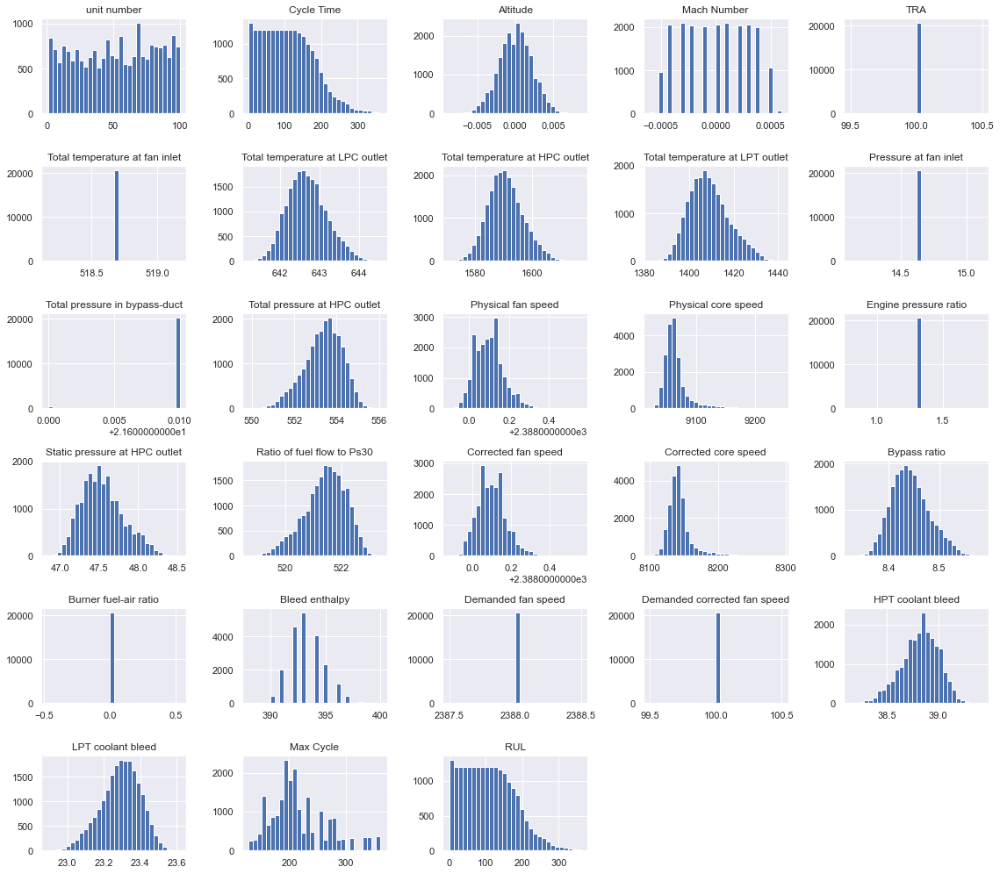

In [19]:
sns.set(font_scale=1) 
df_train.hist(bins=30, figsize=(16,14), color='b')
plt.tight_layout()
plt.show()

### Inference

From this output, we can observe that there are many features with a normal distribution. Some other variables are right or left-skewed. Moreover, it’s evident that operational setting 3 and sensor measurement 1, 5, 6, 10, 16, 18, 19 always have the same value, implying that are not significant variables.

## Box plot

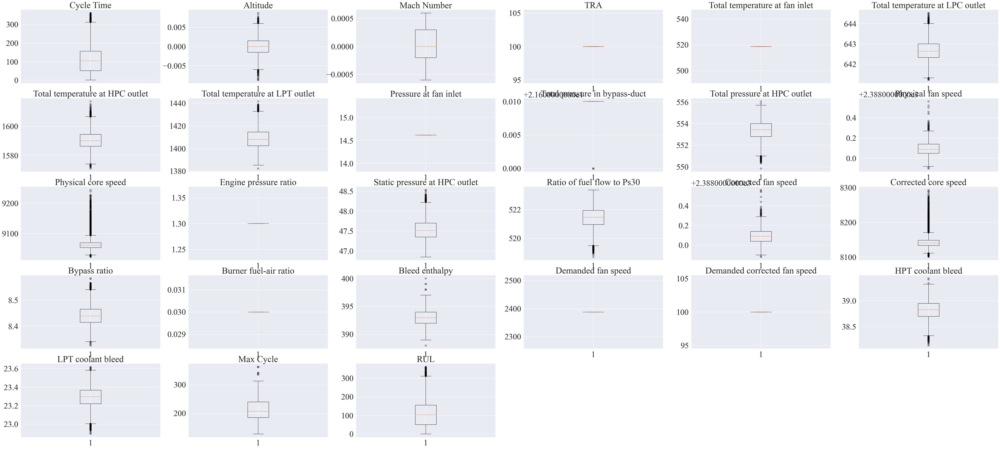

In [20]:
# Box plot for all the features
plt.rcdefaults()
plt.figure(figsize=(70, 50))
sns.set(font_scale=3, font="Times New Roman")
for i in np.arange(1, len(df_train.columns)):
    temp = df_train.iloc[:, i]
    plt.subplot(8, 6, i)
    plt.boxplot(temp)
    plt.title(df_train.columns[i])
plt.show()

### Inference

 - The box plot shows that the features <span class="burk">TRA, Corrected fan Speed, Burner fuel-air ratio, Demanded corrected fan speed</span> dont have much variations in their data. These features wont be contributing much towards the prediction of Remaining Useful life.
 - These features will be eliminated programmatically in the Descriptive statistics section

## time series plot

In [21]:
def plot_signal(df, signal_name, unit_nr=None):
    plt.rcdefaults()
    plt.figure(figsize=(13,5))
    
    if unit_nr:
        plt.plot('RUL', signal_name, 
                data=df[df['unit number']==unit_nr])
    else:
        for i in df_train['unit number'].unique():
            if (i % 10 == 0):  # only ploting every 10th unit_nr
                plt.plot('RUL', signal_name, 
                         data=df[df['unit number']==i])
    plt.xlim(250, 0)  # reverse the x-axis so RUL counts down to zero
    plt.xticks(np.arange(0, 275, 25))
    plt.ylabel(signal_name)
    plt.xlabel('Remaining Use fulLife')
    plt.show()

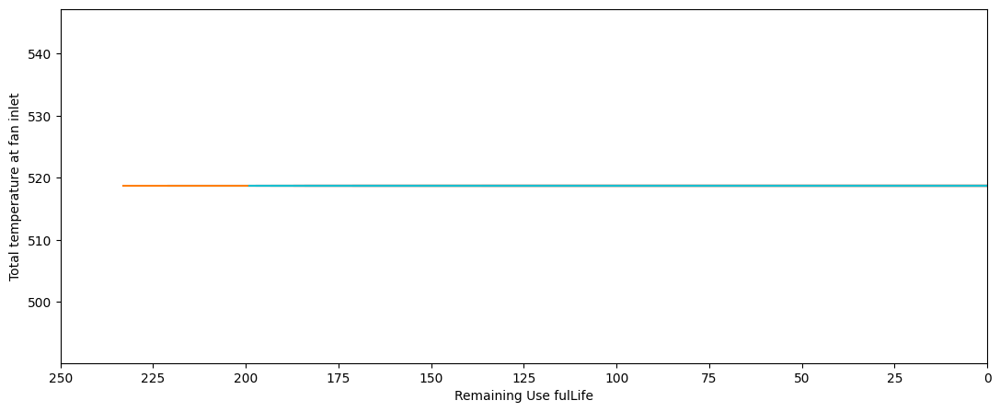

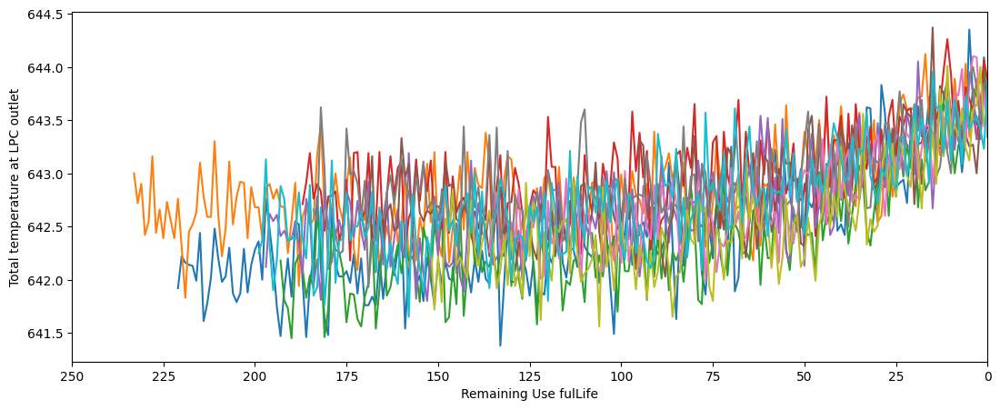

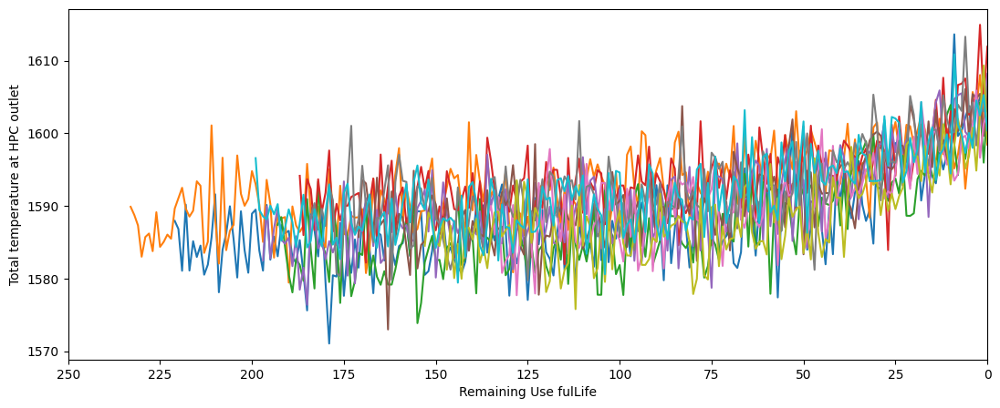

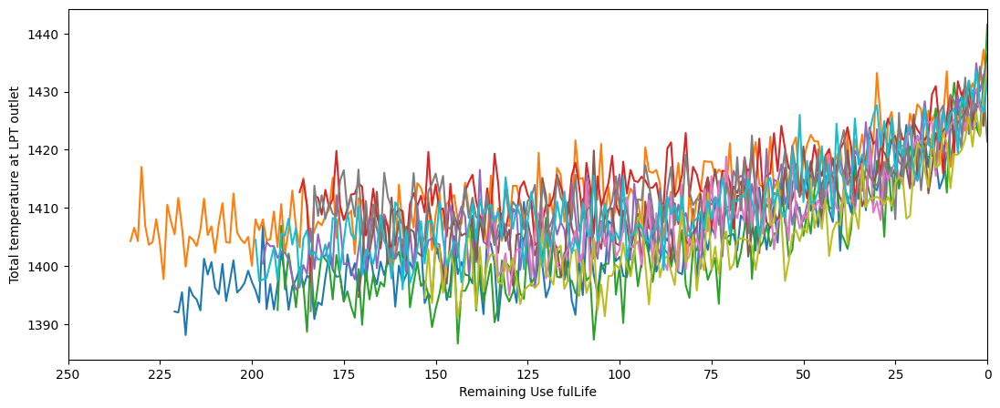

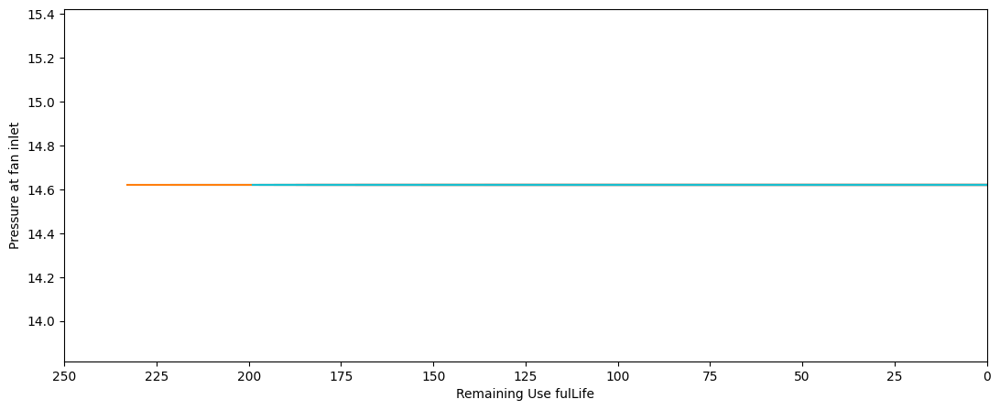

...

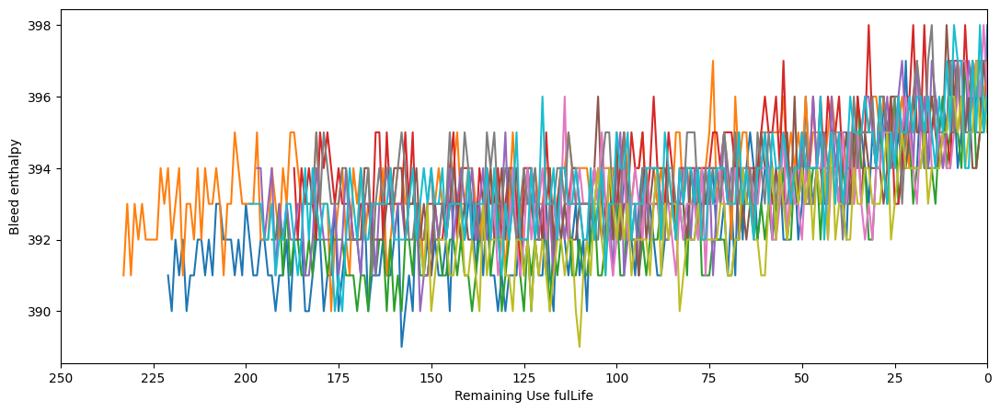

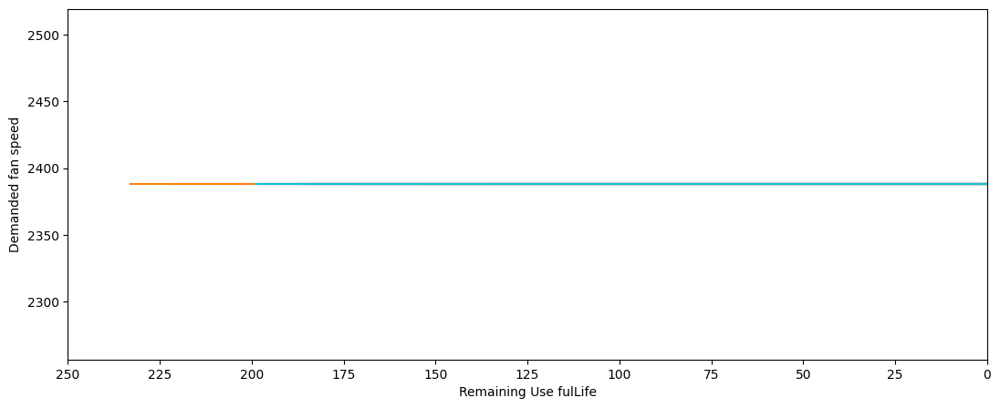

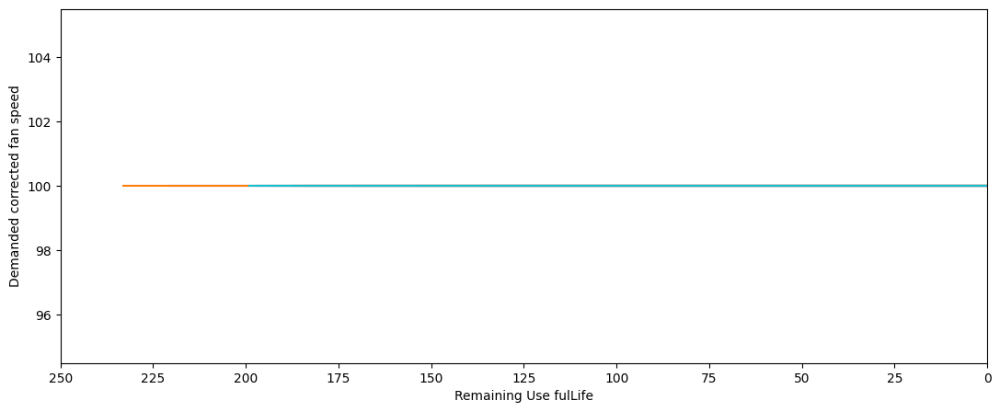

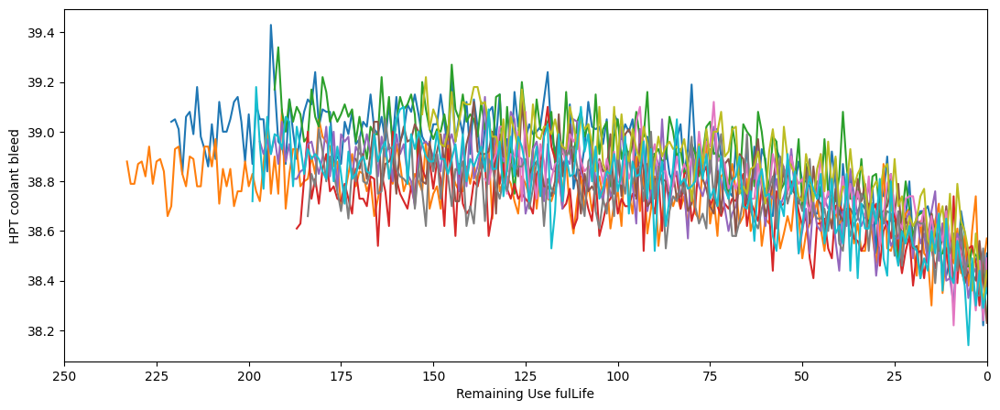

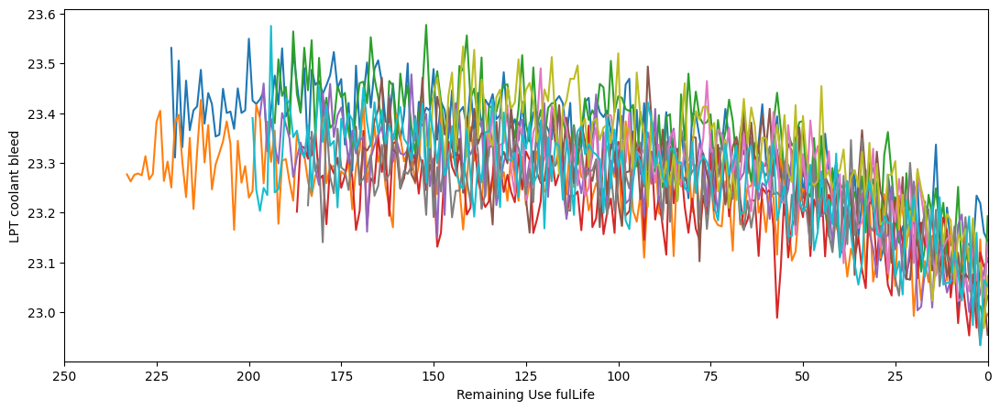

In [22]:
# plot each sensor against RUL
for sensor in sensor_names:
    plot_signal(df_train, sensor)

### Inference

- sensors <span class="burk">'Total temperature at fan inlet', 'Pressure at fan inlet', 'Burner fuel-air ratio', 'Demanded corrected fan speed'</span> look similar but don’t seem very useful.
- Sensor <span class="girk">'Total temperature at LPC outlet',     'Total temperature at HPC outlet', 'Total temperature at LPT outlet', 'Static pressure at HPC outlet', 'Bleed enthalpy</span>' show a similar upward trend and should be included for further model development.
- Sensors <span class="burk">'Total pressure in bypass-duct', 'Engine pressure ratio', 'Burner fuel-air ratio'</span> don’t reveal much trend, we’ll leave those out.
- Sensor <span class="girk">'Total pressure at HPC outlet', 'Ratio of fuel flow to Ps30', 'Bypass ratio', 'HPT coolant bleed', 'LPT coolant bleed'</span> clearly show the distinction between the two faults being developed.
- Sensor <span class="girk">'Physical fan speed','Physical core speed', 'Corrected fan speed', 'Corrected core speed'</span> show similar patterns but with the addition of a fault condition, these signals might do more harm than good for model performance.
- Sensor <span class="burk">'Demanded fan speed'</span> doesn’t seem to hold any information after condition-based standardization

# Feature Extraction
Calculate rolling mean for all the sensor features and add it to the train and test set

In [23]:
df_train_mf = df_train.copy()
df_test_mf = df_test.copy()

In [24]:
# method to calculate rolling mean
def rolling_mean(pandas_df):
    data = pandas_df.rolling(5, min_periods = 1).mean()
    return data

In [25]:
# calculate rolling mean and append to traing & test set
m_sensor_names = []
for column_name in sensor_names:
    mean_list = []
    for unit_num in (df_train_mf['unit number'].unique()):
        df_1 = df_train_mf[df_train_mf['unit number'] == unit_num]
        mean_list.extend(rolling_mean(df_1[column_name]).tolist())
    df_train_mf['m_'+column_name] = mean_list
    m_sensor_names.append('m_'+column_name)

for column_name in sensor_names:
    mean_list = []
    for unit_num in (df_test_mf['unit number'].unique()):
        df_1 = df_test[df_test_mf['unit number'] == unit_num]
        mean_list.extend(rolling_mean(df_1[column_name]).tolist())
    df_test_mf['m_'+column_name] = mean_list


In [26]:
df_train_mf

,unit number,Cycle Time,Altitude,Mach Number,TRA,Total temperature at fan inlet,Total temperature at LPC outlet,Total temperature at HPC outlet,Total temperature at LPT outlet,Pressure at fan inlet,...,m_Ratio of fuel flow to Ps30,m_Corrected fan speed,m_Corrected core speed,m_Bypass ratio,m_Burner fuel-air ratio,m_Bleed enthalpy,m_Demanded fan speed,m_Demanded corrected fan speed,m_HPT coolant bleed,m_LPT coolant bleed
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.660,2388.020,8138.620000,8.419500,0.03,392.000000,2388.0,100.0,39.060000,23.419000
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,521.970,2388.045,8135.055000,8.425650,0.03,392.000000,2388.0,100.0,39.030000,23.421300
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.120,2388.040,8134.446667,8.423033,0.03,391.333333,2388.0,100.0,39.003333,23.395600
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.305,2388.050,8134.292500,8.409325,0.03,391.500000,2388.0,100.0,38.972500,23.390175
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.282,2388.048,8134.194000,8.413340,0.03,391.800000,2388.0,100.0,38.958000,23.393020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,14.62,...,519.890,2388.232,8141.130000,8.520120,0.03,395.800000,2388.0,100.0,38.408000,23.079640
20627,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,...,519.708,2388.234,8139.738000,8.525060,0.03,395.400000,2388.0,100.0,38.356000,23.096120
20628,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,...,519.688,2388.244,8139.544000,8.529500,0.03,395.600000,2388.0,100.0,38.350000,23.078180
20629,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,...,519.712,2388.246,8139.468000,8.532980,0.03,395.800000,2388.0,100.0,38.332000,23.064500


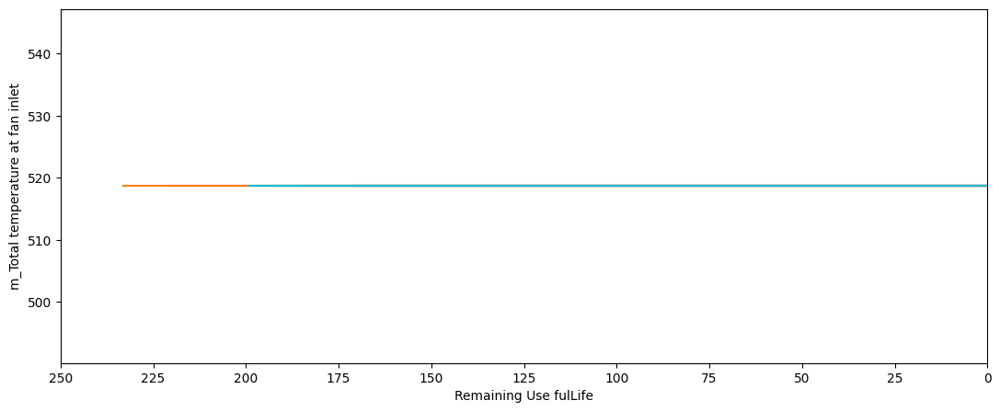

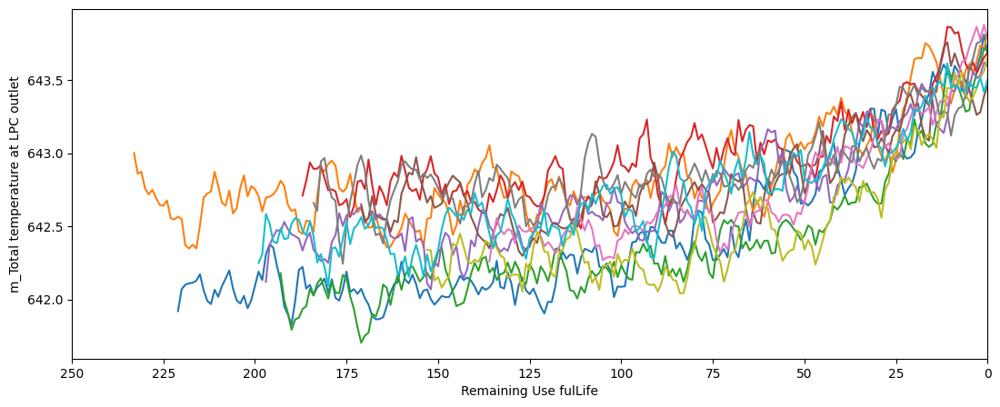

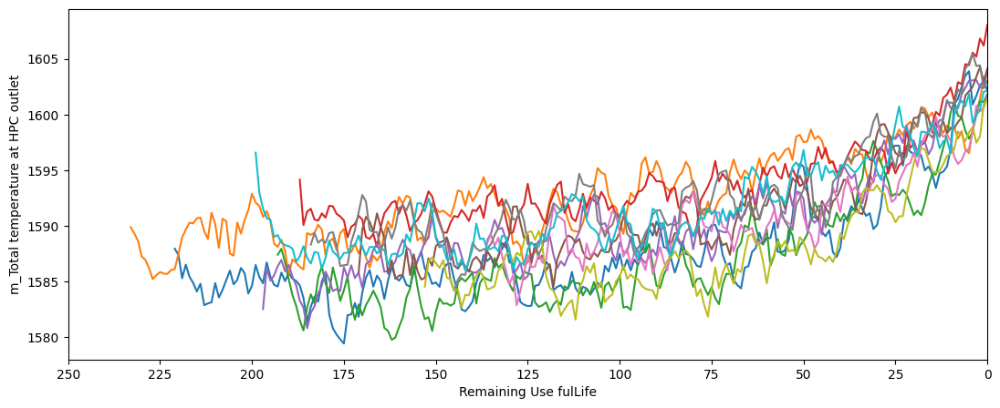

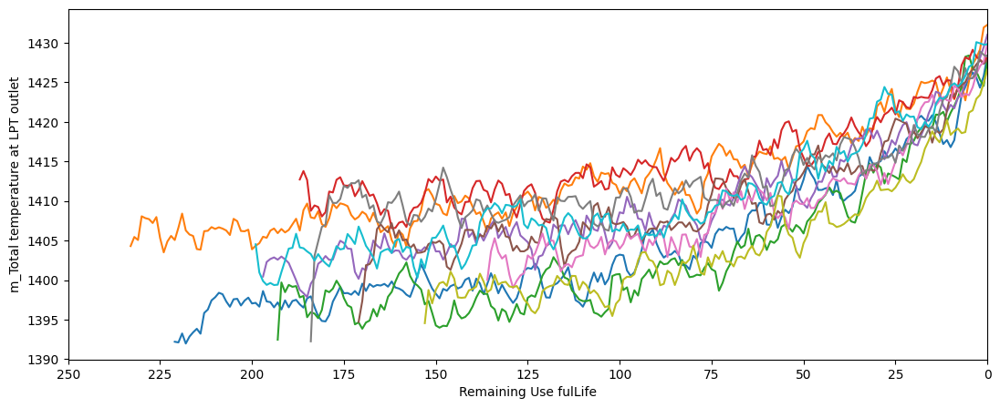

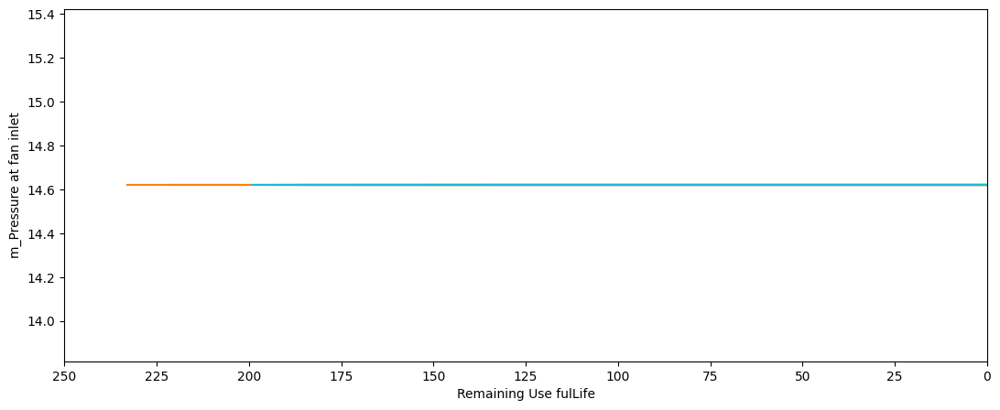

...

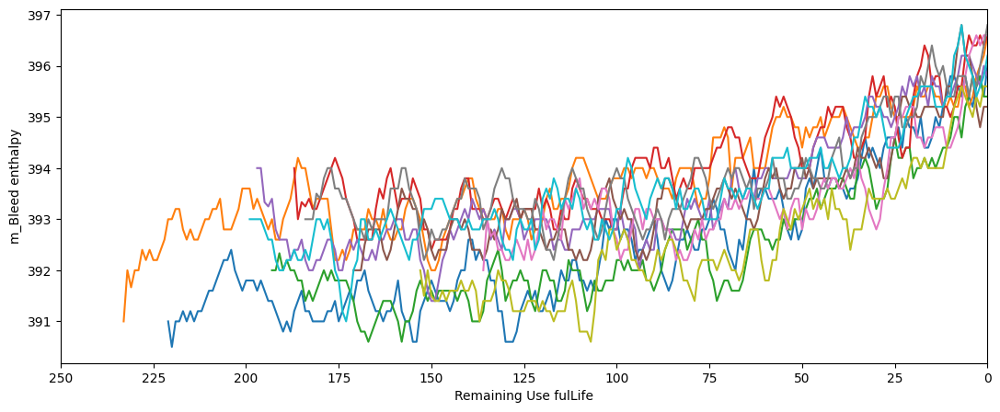

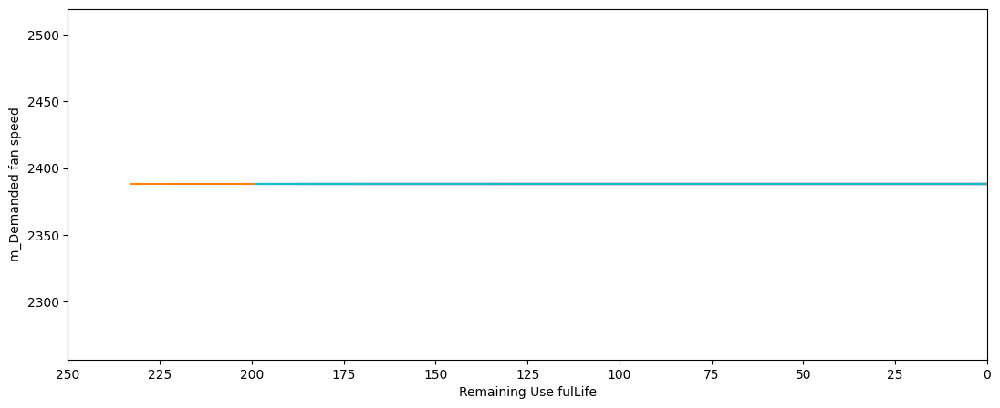

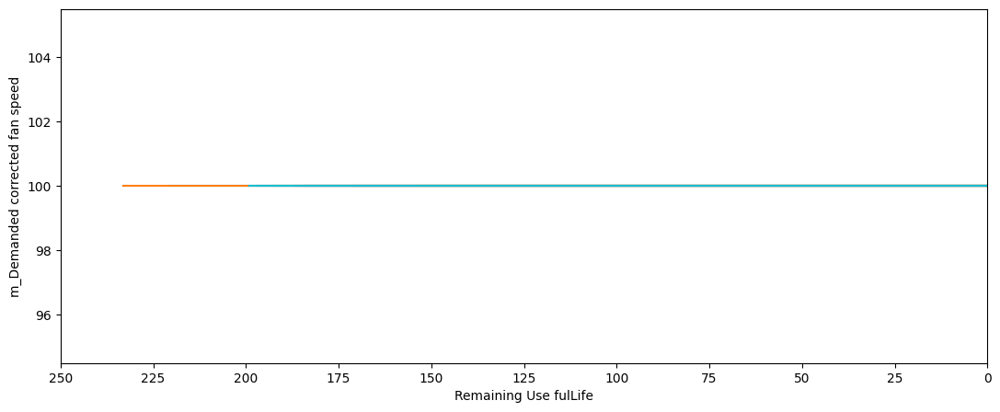

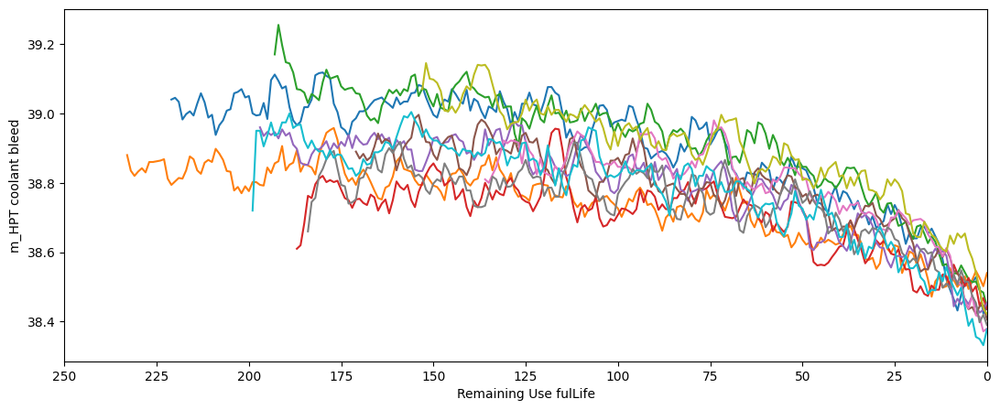

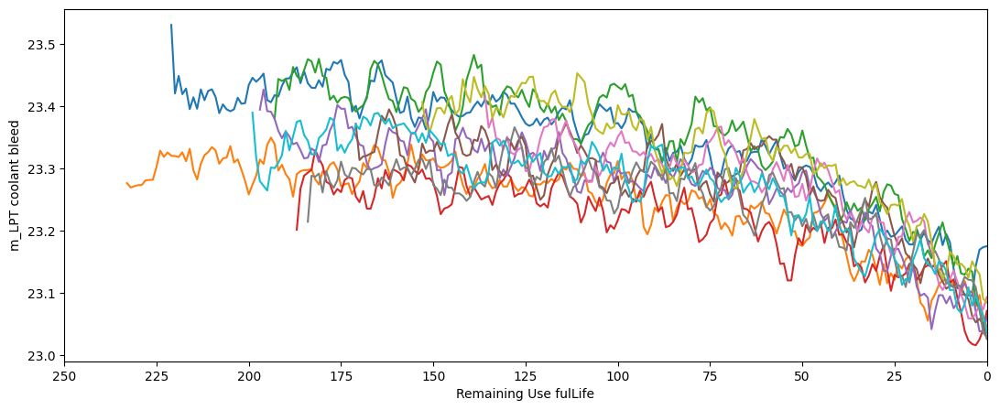

In [27]:
# plot each sensor's moving average against RUL
for sensor in m_sensor_names:
    plot_signal(df_train_mf, sensor)

## Inference

The above plot for moving mean also shows similar pattern as discussed in section 4.3

In [28]:
# these are the sensor fetures which shows some variation for precition of target variable
remaining_sensors = [
    'Total temperature at LPC outlet', 'Total temperature at HPC outlet',
    'Total temperature at LPT outlet', 'Total pressure at HPC outlet',
    'Physical fan speed', 'Physical core speed',
    'Static pressure at HPC outlet', 'Ratio of fuel flow to Ps30',
    'Corrected fan speed', 'Corrected core speed', 'Bypass ratio',
    'Bleed enthalpy', 'HPT coolant bleed', 'LPT coolant bleed'
]

In [29]:
# These features do not have much variation with RUL, hence the won't contribute much towards RUL prediction
drop_sensors = [element for element in sensor_names if element not in remaining_sensors]
drop_sensors

['Total temperature at fan inlet',
 'Pressure at fan inlet',
 'Total pressure in bypass-duct',
 'Engine pressure ratio',
 'Burner fuel-air ratio',
 'Demanded fan speed',
 'Demanded corrected fan speed']

In [30]:
# dropping the unwanted features
df_train.drop(drop_sensors, axis = 1, inplace = True)
df_test.drop(drop_sensors, axis = 1, inplace = True)

# Descriptive statistics

In [31]:
# check if any of the feature has lesser unique values. 
#If any feature has 1 or 2 unique values, which means it will not contribute much in the prediction of RUL.
unique_value = df_train.nunique(axis=0, dropna = True)
unique_value

unit number                         100
Cycle Time                          362
Altitude                            158
Mach Number                          13
TRA                                   1
Total temperature at LPC outlet     310
Total temperature at HPC outlet    3012
Total temperature at LPT outlet    4051
Total pressure at HPC outlet        513
Physical fan speed                   53
Physical core speed                6403
Static pressure at HPC outlet       159
Ratio of fuel flow to Ps30          427
Corrected fan speed                  56
Corrected core speed               6078
Bypass ratio                       1918
Bleed enthalpy                       13
HPT coolant bleed                   120
LPT coolant bleed                  4745
Max Cycle                            66
RUL                                 362
dtype: int64

- Features with 1 or 2 unique values will not contribute much towards the target variable "RUL" prediction. We can drop those columns from the dataframe

In [32]:
# drop the features which has only 1 or 2 unique values programmatically
del_col = []
for i in unique_value.iteritems():
    if (i[1] <= 1):
        del_col.append(i[0])
        drop_sensors.append(i[0])
print("Feature which has 1 or 2 unique values", del_col)
if(len(del_col) > 0):
    df_train.drop(del_col, axis = 1, inplace = True)
    df_test.drop(del_col, axis = 1, inplace = True)

Feature which has 1 or 2 unique values ['TRA']


In [33]:
# this gives a glimplse of statiscal data for all the features.
df_train[df_train.columns].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
unit number,20631.0,51.506568,29.227633,1.0000,26.0000,52.0000,77.0000,100.0000
Cycle Time,20631.0,108.807862,68.880990,1.0000,52.0000,104.0000,156.0000,362.0000
Altitude,20631.0,-0.000009,0.002187,-0.0087,-0.0015,0.0000,0.0015,0.0087
Mach Number,20631.0,0.000002,0.000293,-0.0006,-0.0002,0.0000,0.0003,0.0006
Total temperature at LPC outlet,20631.0,642.680934,0.500053,641.2100,642.3250,642.6400,643.0000,644.5300
Total temperature at HPC outlet,20631.0,1590.523119,6.131150,1571.0400,1586.2600,1590.1000,1594.3800,1616.9100
Total temperature at LPT outlet,20631.0,1408.933782,9.000605,1382.2500,1402.3600,1408.0400,1414.5550,1441.4900
Total pressure at HPC outlet,20631.0,553.367711,0.885092,549.8500,552.8100,553.4400,554.0100,556.0600
Physical fan speed,20631.0,2388.096652,0.070985,2387.9000,2388.0500,2388.0900,2388.1400,2388.5600
Physical core speed,20631.0,9065.242941,22.082880,9021.7300,9053.1000,9060.6600,9069.4200,9244.5900


## Inference

 - Dropped features ('TRA') having 1 or 2 unique values as that won't contribute much towards target variable prediction

# Feature Selection

## Filter Methods

As the name suggest, in this method, you filter and take only the subset of the relevant features. The model is built after selecting the features. The filtering here is done using correlation matrix and it is most commonly done using Pearson correlation.

### Correlation HeatMap for Multicollinearity

[Text(0, 0.5, 'unit number'),
 Text(0, 1.5, 'Cycle Time'),
 Text(0, 2.5, 'Altitude'),
 Text(0, 3.5, 'Mach Number'),
 Text(0, 4.5, 'Total temperature at LPC outlet'),
 Text(0, 5.5, 'Total temperature at HPC outlet'),
 Text(0, 6.5, 'Total temperature at LPT outlet'),
 Text(0, 7.5, 'Total pressure at HPC outlet'),
 Text(0, 8.5, 'Physical fan speed'),
 Text(0, 9.5, 'Physical core speed'),
 Text(0, 10.5, 'Static pressure at HPC outlet'),
 Text(0, 11.5, 'Ratio of fuel flow to Ps30'),
 Text(0, 12.5, 'Corrected fan speed'),
 Text(0, 13.5, 'Corrected core speed'),
 Text(0, 14.5, 'Bypass ratio'),
 Text(0, 15.5, 'Bleed enthalpy'),
 Text(0, 16.5, 'HPT coolant bleed'),
 Text(0, 17.5, 'LPT coolant bleed'),
 Text(0, 18.5, 'Max Cycle'),
 Text(0, 19.5, 'RUL')]

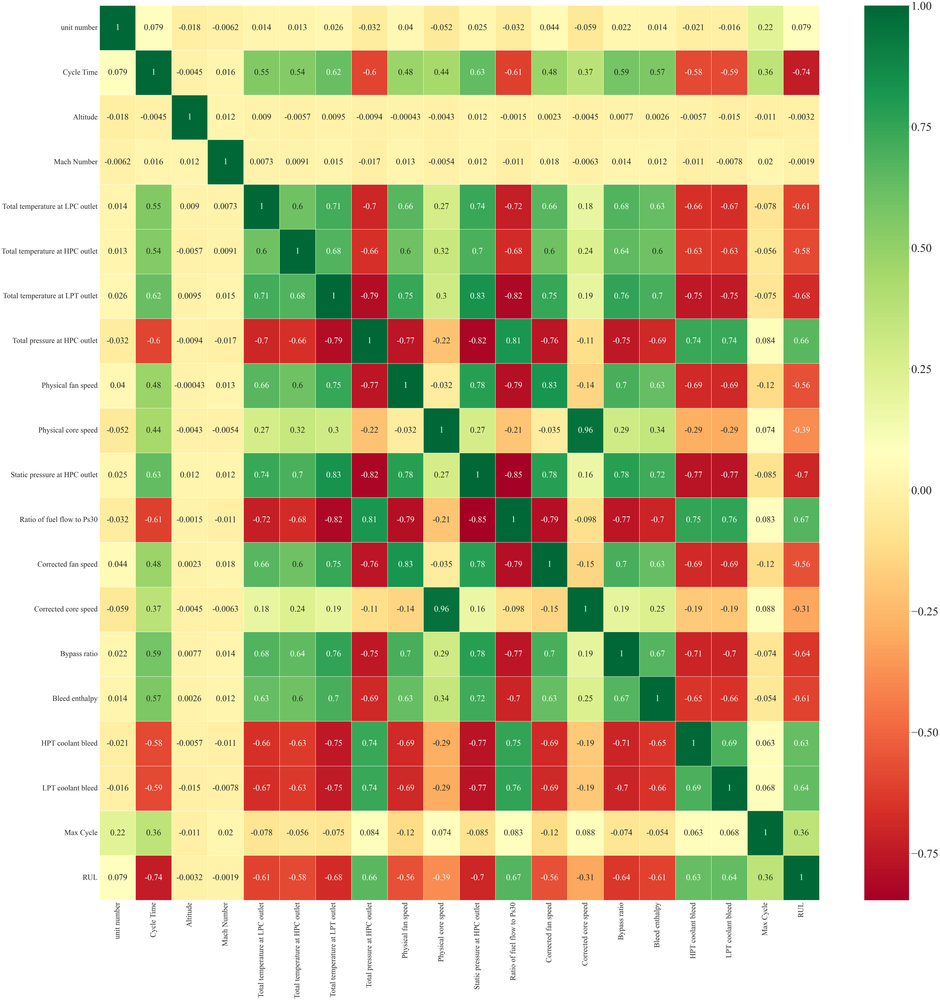

In [34]:
corrmat = df_train.corr()
top_corr_features = corrmat.index

plt.rcdefaults()
plt.figure(figsize=(75,75))
sns.set(font_scale=5, font="Times New Roman")

#plot heat map
hMap = sns.heatmap(df_train[top_corr_features].corr(), cmap="RdYlGn", linewidths=0.2, annot=True, annot_kws={"size": 40})
hMap.set_xticklabels(hMap.get_xmajorticklabels(), fontsize=35)
hMap.set_yticklabels(hMap.get_xmajorticklabels(), fontsize=35)

In [35]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr


In [36]:
# check for highly correlated features with more that 98%
corr_features = correlation(df_train, 0.98)
corr_features

set()

In [37]:
# drop the highly correlated features
if len(corr_features) > 0:
    df_train = df_train.drop(corr_features, axis = 1)
    df_test = df_test.drop(corr_features, axis = 1)

## Inference

 - With the correlation matrix, it is observed that the remaining features are not highly correlated with each other

# Scaling the data

In [38]:
# Copy the original data set for futher use in below sections
df_train_Ori = df_train.copy()
df_test_Ori = df_test.copy()

In [41]:
# Scaling using Standard Scalar
# Applying the scaling for the remaining sensor features
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(df_train[remaining_sensors])
df_train[remaining_sensors] = scaler.transform(df_train[remaining_sensors])
df_test[remaining_sensors] = scaler.transform(df_test[remaining_sensors])

df_train = pd.DataFrame(df_train, columns=df_train.columns)
df_test = pd.DataFrame(df_test, columns=df_test.columns)

Calculate a fraction based on the RUL calculated. This fraction will be our y_train. After prediction, the y_test will be inversed using the same logic.  
Fraction = (Current RUL - min RUL)/(max RUL - min RUL)

In [42]:
def calc_fraction_of_RUL(df_rul_frac, q):
    return ((df_rul_frac['RUL'][q] - df_rul_frac['RUL'].min()) /
            float(df_rul_frac['RUL'].max() - df_rul_frac['RUL'].min()))


rul_fraction = []
df_rul_frac = pd.DataFrame()

for i in range(df_train['unit number'].min(),
               df_train['unit number'].max() + 1):
    df_rul_frac = df_train[df_train['unit number'] == i]
    df_rul_frac = df_rul_frac.reset_index(drop=True)
    for q in range(len(df_rul_frac)):
        rul_fraction.append(calc_fraction_of_RUL(df_rul_frac, q))
df_train['RUL Fraction'] = rul_fraction

In [43]:
df_train

,unit number,Cycle Time,Altitude,Mach Number,Total temperature at LPC outlet,Total temperature at HPC outlet,Total temperature at LPT outlet,Total pressure at HPC outlet,Physical fan speed,Physical core speed,...,Ratio of fuel flow to Ps30,Corrected fan speed,Corrected core speed,Bypass ratio,Bleed enthalpy,HPT coolant bleed,LPT coolant bleed,Max Cycle,RUL,RUL Fraction
0,1,-1.565170,-0.0007,-0.0004,-1.721725,-0.134255,-0.925936,1.121141,-0.516338,-0.862813,...,0.334262,-1.058890,-0.269071,-0.603816,-0.781710,1.348493,1.194427,192,191,1.000000
1,1,-1.550652,0.0019,-0.0003,-1.061780,0.211528,-0.643726,0.431930,-0.798093,-0.958818,...,1.174899,-0.363646,-0.642845,-0.275852,-0.781710,1.016528,1.236922,192,190,0.994764
2,1,-1.536134,-0.0043,0.0003,-0.661813,-0.413166,-0.525953,1.008155,-0.234584,-0.557139,...,1.364721,-0.919841,-0.551629,-0.649144,-2.073094,0.739891,0.503423,192,189,0.989529
3,1,-1.521616,0.0007,0.0000,-0.661813,-1.261314,-0.784831,1.222827,0.188048,-0.713826,...,1.961302,-0.224597,-0.520176,-1.971665,-0.781710,0.352598,0.777792,192,188,0.984293
4,1,-1.507098,-0.0019,-0.0002,-0.621816,-1.251528,-0.301518,0.714393,-0.516338,-0.457059,...,1.052871,-0.780793,-0.521748,-0.339845,-0.136018,0.463253,1.059552,192,187,0.979058
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,1.265868,-0.0004,-0.0003,1.618000,1.216258,2.188375,-2.189329,1.315066,0.012547,...,-2.607969,2.278282,-0.322542,1.425294,2.446751,-1.805173,-2.921113,200,4,0.020101
20627,100,1.280386,-0.0016,-0.0005,1.717992,2.279706,2.738351,-2.833345,1.878576,-0.006020,...,-2.350355,1.722087,-0.380207,1.913240,1.155367,-2.856395,-1.203764,200,3,0.015075
20628,100,1.294904,0.0004,0.0000,1.478011,1.946971,2.138377,-2.742957,2.019453,0.029755,...,-1.902919,2.000184,-0.141684,3.265092,3.092444,-2.081810,-3.292481,200,2,0.010050
20629,100,1.309423,-0.0011,0.0003,1.098043,2.403666,1.955051,-3.036719,2.160330,0.383884,...,-2.363913,1.861136,-0.233948,2.579834,1.155367,-2.911722,-2.085072,200,1,0.005025


In [44]:
df_train_temp = df_train.copy()
df_test_temp = df_test.copy()

In [45]:
# drop the target columns from the train set
df_train_temp = df_train_temp.drop(columns=['Max Cycle', 'RUL', 'RUL Fraction'])

In [46]:
# Split the X & Y for train and test dataset
y_train = df_train['RUL Fraction']
X_train = df_train_temp.copy()
y_test = df_RUL.copy()
X_test = pd.DataFrame(columns=X_train.columns)
X_test[X_train.columns] = df_test_temp[X_train.columns]

## Wrapper Methods

A wrapper method needs one machine learning algorithm and uses its performance as evaluation criteria. This means, you feed the features to the selected Machine Learning algorithm and based on the model performance you add/remove the features. This is an iterative and <span class="mark">computationally expensive process</span> but it is more accurate than the filter method.
There are different wrapper methods such as Backward Elimination, Forward Selection, Bidirectional Elimination and RFE.

### Recursive Feature Elimination

Check how many features are required for better accuracy using RFE

In [48]:
X_train_split, X_test_split, y_train_split, y_test_split = train_test_split(X_train,y_train, test_size = 0.3, random_state = 0)
nof_list = np.arange(1, len(X_train.columns))
high_score = 0
#Variable to store the optimum features
nof = 0
score_list = []
for n in range(len(nof_list)):    
    model = LinearRegression()
    rfe = RFE(model, n_features_to_select=nof_list[n])
    X_train_rfe = rfe.fit_transform(X_train_split, y_train_split)
    X_test_rfe = rfe.transform(X_test_split)
    model.fit(X_train_rfe, y_train_split)
    score = model.score(X_test_rfe, y_test_split)
    score_list.append(score)
    if (score > high_score):
        high_score = score
        nof = nof_list[n]
print("Optimum number of features: %d" % nof)
print("Score with %d features: %f" % (nof, high_score))

Optimum number of features: 17
Score with 17 features: 0.876937


### Inference

 - RFE shows having 17 features shows 87% accuracy in the training data set. Lets further evaluate with SelectKBest algorithm

## Select KBest

In [49]:
from sklearn.feature_selection import SelectKBest, f_classif

# instantiate SelectKBest to determine 20 best features
best_features = SelectKBest(score_func=f_classif, k=len(X_train.columns))
fit = best_features.fit(X_train,y_train)
df_scores = pd.DataFrame(fit.scores_)
df_columns = pd.DataFrame(X_train.columns)
# concatenate dataframes
feature_scores = pd.concat([df_columns, df_scores],axis=1)
feature_scores.columns = ['Feature_Name','Score']  # name output columns
print(feature_scores.nlargest(len(X_train.columns),'Score'))

                       Feature_Name      Score
1                        Cycle Time  17.765959
10    Static pressure at HPC outlet   4.090239
6   Total temperature at LPT outlet   3.721094
11       Ratio of fuel flow to Ps30   3.509629
7      Total pressure at HPC outlet   3.267710
14                     Bypass ratio   3.121892
17                LPT coolant bleed   2.969382
16                HPT coolant bleed   2.909617
15                   Bleed enthalpy   2.693641
4   Total temperature at LPC outlet   2.634064
5   Total temperature at HPC outlet   2.549949
12              Corrected fan speed   2.214832
8                Physical fan speed   2.171098
9               Physical core speed   1.475184
13             Corrected core speed   1.242749
0                       unit number   1.138868
2                          Altitude   1.008448
3                       Mach Number   0.990655


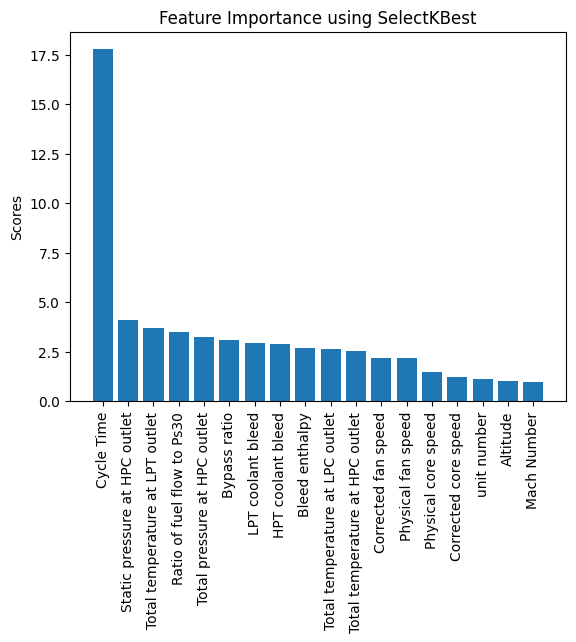

In [50]:
importances = feature_scores.Score
sorted_index=np.argsort(importances)[::-1]
x=range(len(importances))
labels=np.array(feature_scores.iloc[sorted_index].Feature_Name)

plt.rcdefaults()
plt.bar(x,importances[sorted_index],tick_label=labels)
plt.title("Feature Importance using SelectKBest")
plt.ylabel("Scores")
plt.xticks(rotation=90)
plt.show()

- Dropping last three features from the test and train set per the above plot

In [52]:
X_train.drop(['unit number', 'Altitude', 'Mach Number'], axis = 1, inplace = True)
X_test.drop(['unit number', 'Altitude', 'Mach Number'], axis = 1, inplace = True)

# Selected Features

Below are the features selected by feature selection techniques

In [53]:
X_train.columns

Index(['Cycle Time', 'Total temperature at LPC outlet',
       'Total temperature at HPC outlet', 'Total temperature at LPT outlet',
       'Total pressure at HPC outlet', 'Physical fan speed',
       'Physical core speed', 'Static pressure at HPC outlet',
       'Ratio of fuel flow to Ps30', 'Corrected fan speed',
       'Corrected core speed', 'Bypass ratio', 'Bleed enthalpy',
       'HPT coolant bleed', 'LPT coolant bleed'],
      dtype='object')

# Performance Metrics

This section holds the utility methods for calculating performance metrics & for plotting

In [54]:
result_table = []
table_head= ['S.No', 'Method', 'MSE', 'RMSE', 'MAPE', 'MAE']
result_table.append(table_head)
def evaluate(y_test, y_pred, sno, method):
    mse = mean_squared_error(y_test, y_pred).round(decimals=2)
    rmse = np.sqrt(mse).round(decimals=2)
    mae = mean_absolute_error(y_test, y_pred).round(decimals=2)
    mape = mean_absolute_percentage_error(y_test, y_pred).round(decimals=2)
    table_row = [sno, method, mse, rmse, mape, mae]
    result_table.append(table_row)
    print('Mean Squared Error: ', mse)
    print('Root Mean Squared Error: ', rmse)
    print('Mean Absolute Percentage Error: ', mape) 
    print('Mean Absolute Error: ', mae)  

In [55]:
# plot Actual RUL vs Predicted RUL
def plot_rul(y_test, y_pred, title):
    plt.rcdefaults()
    plt.figure(figsize=(16, 4))
    sns.set(font_scale=1.2, font="Times New Roman")
    plt.grid(False)
    #plt.plot(get_max_cycle(y_test)['RUL'], marker=".", markersize=8, color="red", label = 'Actual RUL', linewidth=1)
    #plt.plot(get_max_cycle(y_pred)['RUL'], marker=".", markersize=8, color="blue", label = 'Predicted RUL', linewidth=1)
    plt.plot(y_test['RUL'], marker=".", markersize=8, color="red", label = 'Actual RUL', linewidth=1)
    plt.plot(y_pred['RUL'], marker=".", markersize=8, color="blue", label = 'Predicted RUL', linewidth=1)
    plt.title("Actual vs Predicted RUL - " + title, weight='bold')
    plt.xlabel('Unit Number (max Cycle)', weight='bold')
    plt.ylabel('RUL', weight='bold')
    plt.legend()
    plt.show()
    
def get_max_cycle(df_test_pred):
    df_test_pred = pd.DataFrame(df_test_pred, columns=['RUL'])
    df = df_test_pred.copy()
    df['unit number'] = df_test_Ori['unit number']
    df['Cycle Time'] = df_test_Ori['Cycle Time']
    unit_num_list = df['unit number'].tolist()
    unit_num_list = list(dict.fromkeys(unit_num_list))
    unit_num_list.remove(1)
    df_plot_test = df[df['unit number']==1][df['Cycle Time'] == df[df['unit number']==1]['Cycle Time'].max()]
    for i in unit_num_list:
        test_temp = df[df['unit number']==i][df['Cycle Time'] == df[df['unit number']==i]['Cycle Time'].max()]
        df_plot_test = df_plot_test.append(test_temp)
    df_plot_test = df_plot_test.reset_index(drop=True)
    return df_plot_test

In [56]:
df_test

,unit number,Cycle Time,Altitude,Mach Number,Total temperature at LPC outlet,Total temperature at HPC outlet,Total temperature at LPT outlet,Total pressure at HPC outlet,Physical fan speed,Physical core speed,Static pressure at HPC outlet,Ratio of fuel flow to Ps30,Corrected fan speed,Corrected core speed,Bypass ratio,Bleed enthalpy,HPT coolant bleed,LPT coolant bleed
0,1,-1.565170,0.0023,0.0003,0.678077,-0.853550,-1.191480,0.601408,-0.798093,-0.682579,-1.277396,0.415614,-0.919841,-0.954235,-0.985107,-0.781710,0.241943,0.774097
1,1,-1.550652,-0.0027,-0.0003,-1.941707,-0.338137,-1.501467,1.674769,-1.220725,-0.490117,-0.154141,1.012195,-0.502695,-0.216648,-1.649034,-0.136018,1.127183,0.941305
2,1,-1.536134,0.0003,0.0001,-0.441831,-0.584426,-0.843717,0.838677,-0.657216,-0.375093,-0.154141,0.754581,-0.919841,-0.715712,0.052112,-0.136018,1.459148,1.172256
3,1,-1.521616,0.0042,0.0000,-0.481827,-1.044384,-0.279297,0.793483,-0.938970,-0.903570,-0.977861,-0.045381,-0.641744,-0.568929,-1.345067,-1.427402,1.016528,0.775945
4,1,-1.507098,0.0014,0.0000,-0.341839,-0.543650,-0.779276,0.895170,-1.220725,-0.937081,-0.865536,0.998637,-0.919841,-0.745069,-1.041101,-2.073094,0.961200,1.138999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13091,100,1.236832,0.0049,0.0000,1.118041,1.456023,0.761769,0.047780,-1.079848,3.492703,0.557254,-0.980929,-1.336988,3.644806,0.782698,0.509675,-0.919933,-0.852719
13092,100,1.251350,-0.0011,-0.0001,1.078044,0.842747,1.457295,-0.166892,-0.657216,3.416171,0.220277,-0.492817,-0.085548,3.517419,0.241425,1.155367,-1.362553,-0.116449
13093,100,1.265868,-0.0006,-0.0003,1.518008,0.428459,-0.234855,-0.370266,0.188048,3.693768,0.107952,-0.316554,-0.780793,3.852400,0.393408,1.155367,-1.085916,-0.781586
13094,100,1.280386,-0.0038,0.0001,1.158038,0.728573,1.158419,0.002586,-0.375461,3.786150,0.257719,-0.113174,-0.224597,4.022249,0.772033,1.155367,-0.864606,-0.182962


In [57]:
# utility methods to calculate Predicted RUL from Predicted RUL fraction
df_test['Cycle Time'] = df_test_Ori['Cycle Time']
df_test = pd.merge(df_test, df_test.groupby('unit number', as_index=False)['Cycle Time'].max(), how='left', on='unit number')
df_test.rename(columns={"Cycle Time_x": "Cycle Time", "Cycle Time_y": "Max Cycle"}, inplace=True)
    
def totcycles(data):
    return(data['Cycle Time'] / (1-data['score']))

def RULfunction(data):
    return(data['maxpredcycles'] - data['Max Cycle'])

def getPredictedRUL(y_pred):
    df_test['score'] = y_pred
    df_test['maxpredcycles'] = totcycles(df_test)
    df_test['RUL'] = RULfunction(df_test)
    t = df_test.columns == 'RUL'
    ind = [i for i, x in enumerate(t) if x]
    predictedRUL = []
    for i in range(df_test['unit number'].min(), df_test['unit number'].max() + 1):
        npredictedRUL = df_test[df_test['unit number'] == i].iloc[
            df_test[df_test['unit number'] == i]['Cycle Time'].max() - 1, ind]
        predictedRUL.append(npredictedRUL)
    predictedRUL = pd.DataFrame(predictedRUL, columns=['RUL'])
    predictedRUL = predictedRUL.reset_index(drop=True)
    return predictedRUL

# Algorithms

## HyperParameters tuning for various Algorithms

Storing all the hyperparameters for all the models that is being used in below sections in a python dictionary

In [132]:
hyperparameters = {
    'Random_Forest_Regression': {
        'algorithm': RandomForestRegressor(),
        'parameters': {
            'n_estimators': [100, 200, 300],
            'max_depth': [10, 20, 30],
            'max_features': [4, 6, 8, 10],
            'min_samples_leaf': [6, 8, 10]
         }
    },
    
     'Decision_Tree_Regression': {
        'algorithm':DecisionTreeRegressor(),
        'parameters':{
            'splitter':['best','random'],
            'max_depth' : [50, 100, 150],
            'min_samples_leaf':[20, 40, 60],
            'max_features':['auto','log2','sqrt',None]
        }
    },
    
    'SVR': {
        'algorithm': SVR(),
        'parameters': {
            'kernel': ['linear', 'rbf','poly'], 
            'C':[1.5, 10],
            'gamma': [1e-7, 1e-4],
            'epsilon':[0.1,0.2,0.5,0.3]
        }
    },
    
    'KNN': {
        'algorithm': KNeighborsRegressor(),
        'parameters': {
            'n_neighbors': [20, 40, 60, 80],
            'weights': ['uniform', 'distance']
        }
        
    }, 
    
    'Lasso_Regression': {
        'algorithm': Lasso(),
        'parameters': {
            'alpha':[0.01, 0.02, 0.03, 0.04, 0.05]
        }
    }   
}

In [131]:
# get the model hyperparameters from the dictionary and execute one by one for finding best hyper parameters
from sklearn.model_selection import GridSearchCV
for hyperparam in hyperparameters.values():
    algorithm = hyperparam.get('algorithm')
    parameters = hyperparam.get('parameters')
    grid_search_cv_model = GridSearchCV(estimator=algorithm, param_grid=parameters, cv=3)
    grid_search_cv_model.fit(X_train, y_train)
    print('Algorithm: ' + str(algorithm))
    print('Optimized Parameters: ' + str(grid_search_cv_model.best_params_))
    print("====================================")

Algorithm: RandomForestRegressor()
Optimized Parameters: {'max_depth': 10, 'max_features': 4, 'min_samples_leaf': 10, 'n_estimators': 100}
Algorithm: DecisionTreeRegressor()
Optimized Parameters: {'max_depth': 50, 'max_features': 'auto', 'min_samples_leaf': 60, 'splitter': 'random'}
Algorithm: SVR()
Optimized Parameters: {'C': 10, 'epsilon': 0.3, 'gamma': 0.0001, 'kernel': 'rbf'}
Algorithm: KNeighborsRegressor()
Optimized Parameters: {'n_neighbors': 40, 'weights': 'distance'}
Algorithm: Lasso()
Optimized Parameters: {'alpha': 0.03}


## Inference

 - AFter hyperparameters tuning, we got the optimized hyper parameters, which will be used in the algorithms in below sections

## Linear Regression

In [59]:
# Running RFE with the output number of the variable equal to 10
lm = LinearRegression()
lm.fit(X_train, y_train)
X_train_rfe = sm.add_constant(X_train)
y_pred_lm = lm.predict(X_test)

In [60]:
predictedRUL = getPredictedRUL(y_pred_lm)

In [61]:
evaluate(y_test, predictedRUL, "1", "Linear Regression")

Mean Squared Error:  1201.11
Root Mean Squared Error:  34.66
Mean Absolute Percentage Error:  0.64
Mean Absolute Error:  27.27


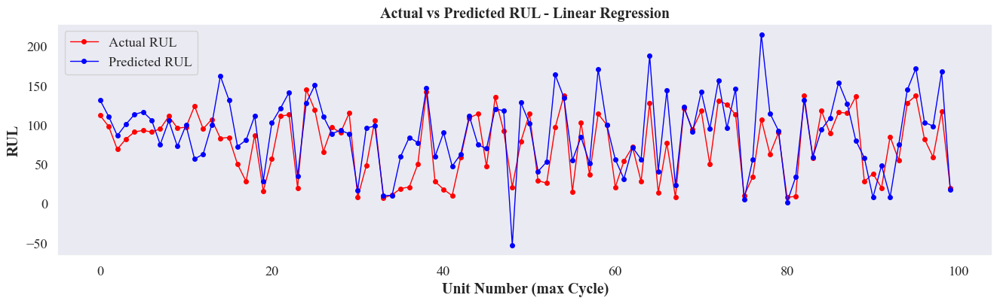

In [62]:
plot_rul(y_test, predictedRUL, "Linear Regression")

## Random Forest Regression

In [63]:
rf = RandomForestRegressor(n_estimators = 200,
                            max_depth = 10,
                            max_features = 4,
                            min_samples_leaf = 10,
                            random_state = 42)

rf.fit(X_train, y_train)

y_pred_rf = rf.predict(X_test)
predictedRUL_rf = getPredictedRUL(y_pred_rf)

evaluate(y_test, predictedRUL_rf, "2", "Random Forest Regression")

Mean Squared Error:  558.51
Root Mean Squared Error:  23.63
Mean Absolute Percentage Error:  0.29
Mean Absolute Error:  17.38


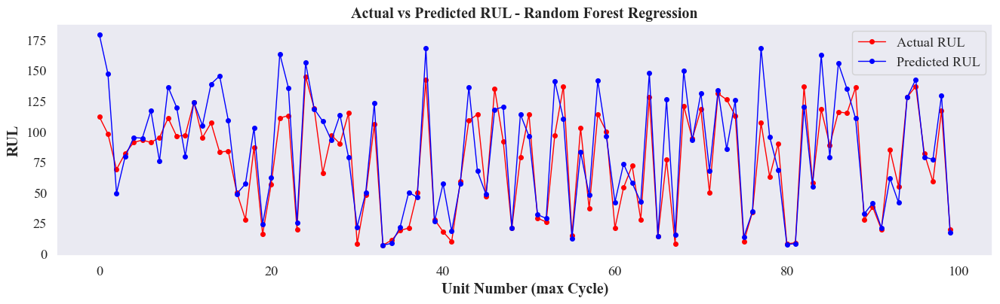

In [64]:
plot_rul(y_test, predictedRUL_rf, "Random Forest Regression")

## DecisionTree Regression

In [65]:
from sklearn.tree import DecisionTreeRegressor

# Define model. Specify a number for random_state to ensure same results each run
Tree_model = DecisionTreeRegressor(max_depth=100,
                      max_features='auto', min_samples_leaf=40,
                      random_state=42, splitter='random')

# Fit model
Tree_model.fit(X_train, y_train)
Tree_predictions = Tree_model.predict(X_test)
predictedRUL_DT = getPredictedRUL(Tree_predictions)
evaluate(y_test, predictedRUL_DT, "3", "Decision Tree Regression")

Mean Squared Error:  582.63
Root Mean Squared Error:  24.14
Mean Absolute Percentage Error:  0.33
Mean Absolute Error:  18.45


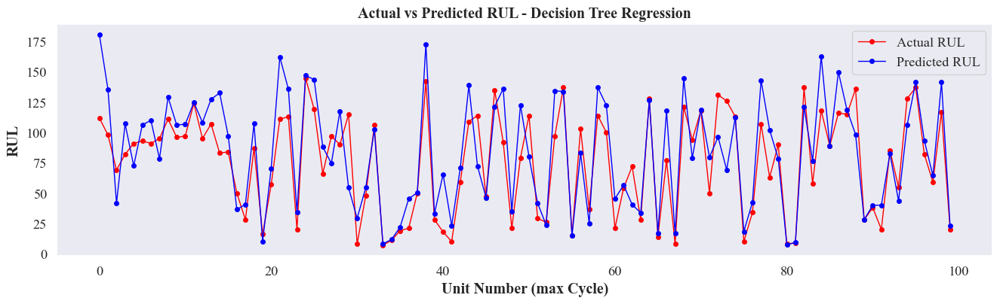

In [66]:
plot_rul(y_test, predictedRUL_DT, "Decision Tree Regression")

## SVR

In [67]:
regressor = SVR(kernel = 'rbf')
regressor.fit(X_train, y_train)
y_pred_SVR = regressor.predict(X_test)
predictedRUL_SVR = getPredictedRUL(y_pred_SVR)

In [68]:
evaluate(y_test, predictedRUL_SVR, "4", "SVR")

Mean Squared Error:  528.21
Root Mean Squared Error:  22.98
Mean Absolute Percentage Error:  0.3
Mean Absolute Error:  17.17


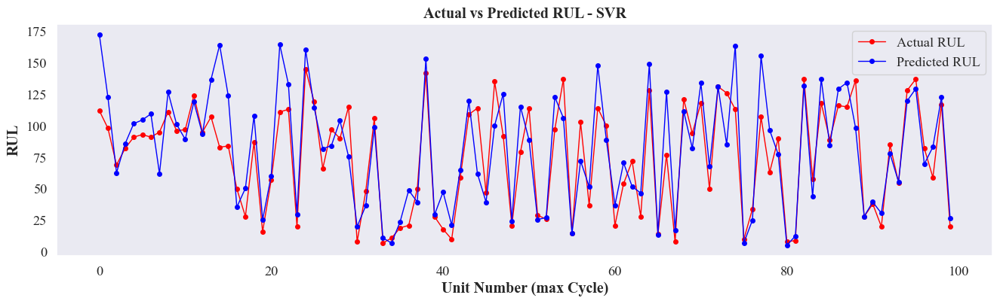

In [69]:
plot_rul(y_test, predictedRUL_SVR, "SVR")

## Lasso Regression

In [70]:
lassoReg = Lasso(alpha=0.03)
lassoReg.fit(X_train, y_train)
y_pred_lasso = lassoReg.predict(X_test)
predictedRUL_LR = getPredictedRUL(y_pred_lasso)
evaluate(y_test, predictedRUL_LR, "5", "Lasso Regression")

Mean Squared Error:  1104.82
Root Mean Squared Error:  33.24
Mean Absolute Percentage Error:  0.83
Mean Absolute Error:  28.02


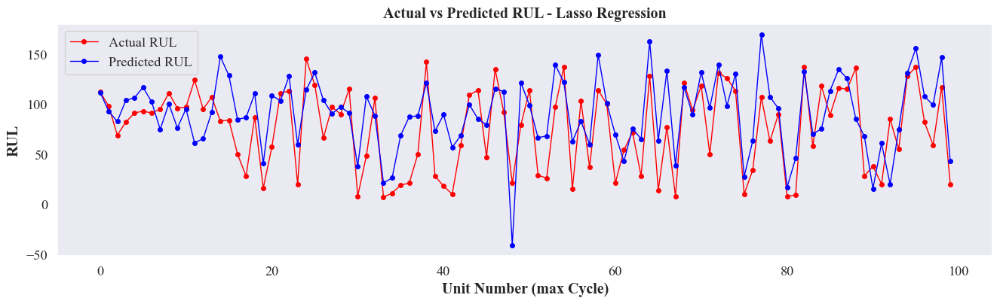

In [71]:
plot_rul(y_test, predictedRUL_LR, "Lasso Regression")

## KNN Regressor

In [72]:
knn = KNeighborsRegressor(n_neighbors=60, weights='uniform')
knn.fit(X_train, y_train)
y_pred_knn = knn.predict(X_test)
predictedRUL_KNN = getPredictedRUL(y_pred_knn)
evaluate(y_test, predictedRUL_KNN, "6", "KNN")

Mean Squared Error:  1145.75
Root Mean Squared Error:  33.85
Mean Absolute Percentage Error:  0.35
Mean Absolute Error:  22.99


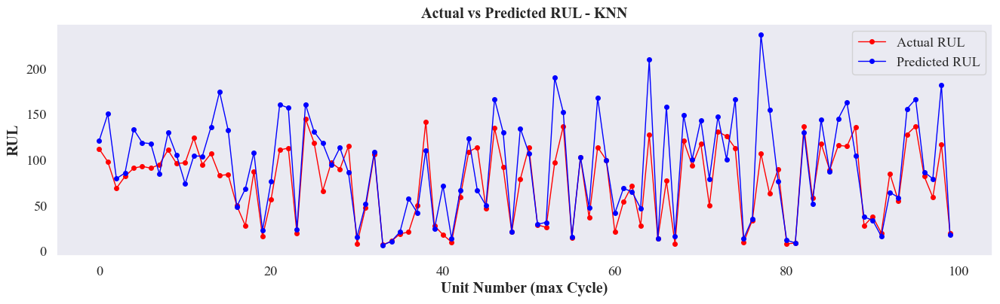

In [73]:
plot_rul(y_test, predictedRUL_KNN, "KNN")

# Time Series Analysis

## Stationary check

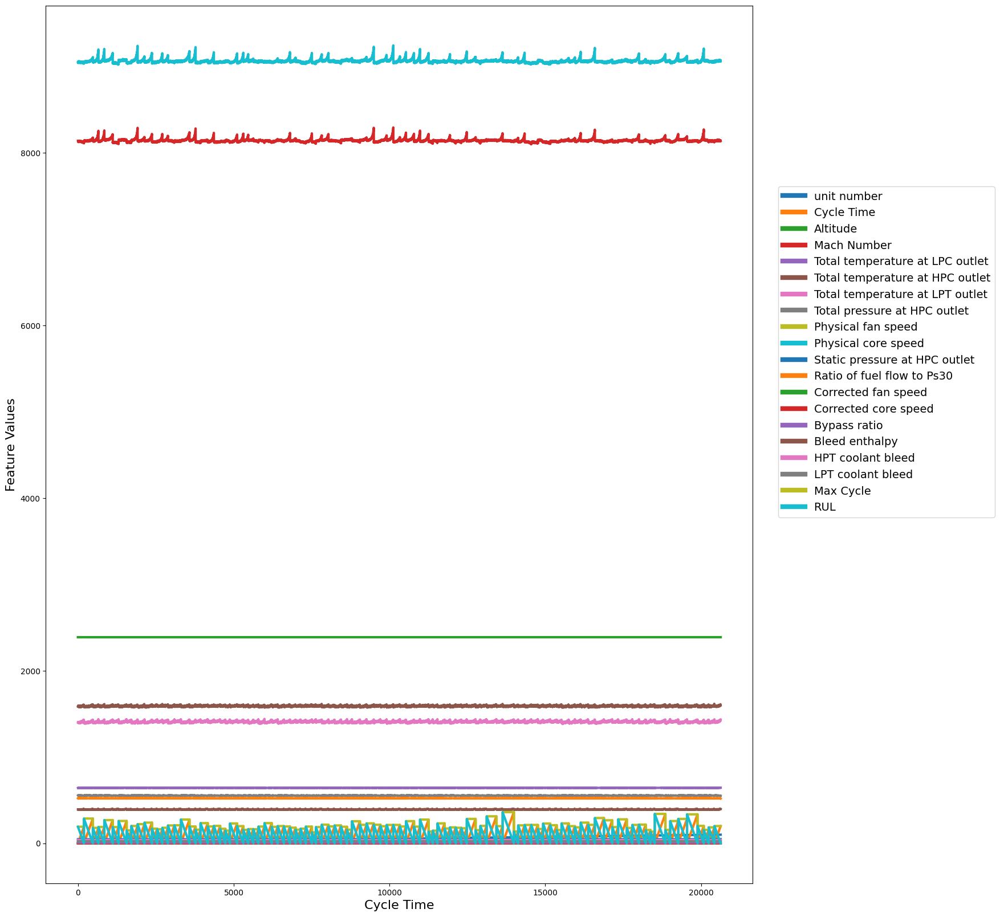

In [74]:
plt.rcdefaults()
plt.figure(figsize=(16, 20))
fig = plt.figure(1)
ax1 = fig.add_subplot(111)
ax1.set_xlabel('Cycle Time', fontsize=16)
ax1.set_ylabel('Feature Values', fontsize=16)
ax1.plot(df_train_Ori, linewidth=3)
leg = ax1.legend(df_train_Ori.columns, bbox_to_anchor = (1.35, 0.8), fontsize = 14)
# get the individual lines inside legend and set line width
for line in leg.get_lines():
    line.set_linewidth(6)
plt.show()

<span class="burk">The above plot clearly shows the time series trend in the data set for a given engine unit</span>. It also shows the dataset is stationary but we will confirm the same in the next section.

 - Stationarity implies the statistical properties of the time series, such as mean and variance do not change over time, in addition the covariance (spread of the time series) should not be dependent on time.
 - It is important that these statistical properties stay constant because a lot of statistical models rely on these properties for their predictions. 
 - Hence, if the mean, variance or covariance changes with time the model would not be able to accurately predict the next value.

Perform Augmented Dicky fuller test test to check whether the data is stationary which is essential for time series prediction

In [75]:
from statsmodels.tsa.stattools import adfuller
# In this test we perform null hypothesis check. If null hypothesis, the data is non-stationary. 
#If  p < 5%, the null hypotheisis is rejected, hence the data is stationary 
def adf_test(series,title=''):
    result = adfuller(series.dropna(),autolag='AIC')
    if result[1] <= 0.05:
        print(f'"{title}" is stationary')
    else:
        print(f'"{title}" is non-stationary')

In [76]:
# get all the features from the data set and perfom stationary check
for column in X_train.columns:
    adf_test(X_train[column], column)

"Cycle Time" is stationary
"Total temperature at LPC outlet" is stationary
"Total temperature at HPC outlet" is stationary
"Total temperature at LPT outlet" is stationary
"Total pressure at HPC outlet" is stationary
"Physical fan speed" is stationary
"Physical core speed" is stationary
"Static pressure at HPC outlet" is stationary
"Ratio of fuel flow to Ps30" is stationary
"Corrected fan speed" is stationary
"Corrected core speed" is stationary
"Bypass ratio" is stationary
"Bleed enthalpy" is stationary
"HPT coolant bleed" is stationary
"LPT coolant bleed" is stationary


#### Inference

- The above <span class="girk">Augmented Dicky fuller test confirms that all our independent features are stationary</span> which is good for time series analysis

## LSTM

In [88]:
import tensorflow as tf
from tensorflow.keras import Sequential

In [89]:
from tensorflow.keras.layers import LSTM, Dense, Dropout, Masking, TimeDistributed

In [90]:
# Let’s initialize our RNN
regressor = Sequential()
regressor.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
# Now, add the first layer of LSTM and some Dropout regularisation
regressor.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
regressor.add(Dropout(0.2))
#Now, add the second layer of LSTM and some Dropout regularisation
regressor.add(LSTM(units = 50, return_sequences = True))
regressor.add(Dropout(0.2))
# Now, add the third layer of LSTM and some Dropout regularisation
regressor.add(LSTM(units = 50, return_sequences = True))
regressor.add(Dropout(0.2))
# Now, add the fourth layer of LSTM and some Dropout regularisation
regressor.add(LSTM(units = 50))
regressor.add(Dropout(0.2))

# Let’s add an output layer
regressor.add(Dense(units = 1))

In [91]:
# Next, we will compile our RNN model here.
regressor.compile(optimizer = 'adam', loss = 'mean_squared_error')
history_LSTM = regressor.fit(X_train, y_train, epochs = 30, batch_size = 32)
y_pred_LSTM = regressor.predict(X_test)

Epoch 1/30
645/645 [==============================] - 33s 34ms/step - loss: 0.0212
Epoch 2/30
645/645 [==============================] - 22s 34ms/step - loss: 0.0084
Epoch 3/30
645/645 [==============================] - 22s 34ms/step - loss: 0.0069
Epoch 4/30
645/645 [==============================] - 22s 34ms/step - loss: 0.0064
Epoch 5/30
645/645 [==============================] - 22s 34ms/step - loss: 0.0059
Epoch 6/30
645/645 [==============================] - 22s 34ms/step - loss: 0.0057
Epoch 7/30
645/645 [==============================] - 23s 36ms/step - loss: 0.0054
Epoch 8/30
645/645 [==============================] - 24s 37ms/step - loss: 0.0053
Epoch 9/30
645/645 [==============================] - 23s 35ms/step - loss: 0.0052
Epoch 10/30
645/645 [==============================] - 22s 34ms/step - loss: 0.0052
Epoch 11/30
645/645 [==============================] - 22s 34ms/step - loss: 0.0050
Epoch 12/30
645/645 [==============================] - 23s 36ms/step - loss: 0.0049
E

In [92]:
predictedRUL_LSTM = getPredictedRUL(y_pred_LSTM)
evaluate(y_test, predictedRUL_LSTM, "7", "LSTM")

Mean Squared Error:  530.11
Root Mean Squared Error:  23.02
Mean Absolute Percentage Error:  0.27
Mean Absolute Error:  16.69


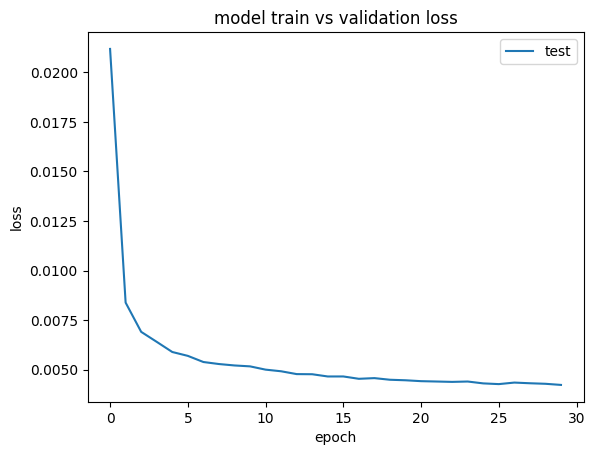

In [93]:
plt.rcdefaults()
plt.plot(history_LSTM.history['loss'])
plt.title('model train vs validation loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['test', 'validation'], loc='upper right')
plt.show()

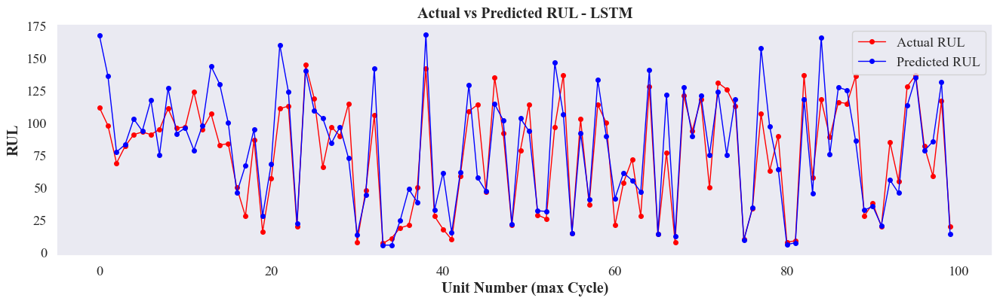

In [94]:
plot_rul(y_test, predictedRUL_LSTM, "LSTM")

## Principal Component Analysis

<span class="mark">Principal Component Analysis is a mathematical technique used for dimensionality reduction</span>. Its goal is to reduce the number of features whilst keeping most of the original information.

In [95]:
from sklearn.decomposition import PCA

In [96]:
# utility method for plotting health index
def plot_health_index(df_input, unit_num, dataFrameType, chartTitle):
    plt.rcdefaults()
    df = df_input.copy()    
    if dataFrameType == "test":
        df['unit number'] = df_test_Ori['unit number']
        df['Cycle Time'] = df_test_Ori['Cycle Time']
        df['hue'] = create_cluster(df, dataFrameType)
    if dataFrameType == "train":
        df['unit number'] = df_train_Ori['unit number']
        df['Cycle Time'] = df_train_Ori['Cycle Time']
        df['hue'] = create_cluster(df, dataFrameType)
    palette ={"Good": "green", "Degrading": "orange", "Fail": "red"}
    sns.scatterplot(x = 'Cycle Time', y='Health Index', data =df[df['unit number'] == unit_num], hue='hue', palette=palette).set(title=chartTitle)
    plt.legend(title='Health')
    plt.ylim(0, 1)
    plt.show()

In [97]:
# utility method for creating health index
def create_health_index(df):
    unit_numbers = list(df['unit number'].unique())
    health_index = []
    for unit_num in unit_numbers:
        max_rul = df[df['unit number'] == unit_num]['RUL'].max()
        index_list = list(df[df['unit number'] == unit_num].index)
        for idx in index_list:
            rul_value = df[df['unit number'] == unit_num]['RUL'].get(idx)
            health_index.append((rul_value/max_rul).round(decimals=3))
    return health_index

In [98]:
# utilit method for creating Health conditions (Good - first 5% of data in each unit, Fail - last 5% of data in each unit, 
# Degrading - data inbetween)
def create_cluster(df):
    cluster = []
    for unit_num in (df_train_Ori['unit number'].unique()):
        unit_num_len = len(df[df['unit number'] == unit_num])
        ten_percent = round(unit_num_len * 0.1)
        five_percent = round(unit_num_len * 0.05)
        for x in range(0, ten_percent):
            cluster.append('Good')
        for x in range(ten_percent, unit_num_len - five_percent):
            cluster.append('Degrading')
        for x in range(unit_num_len - five_percent, unit_num_len):
            cluster.append('Fail')
    return cluster

In [99]:
# initialize PCA components
pca = PCA(n_components=2)
pca.fit(X_train)
pca_X_train = pca.transform(X_train)
pca_X_test = pca.transform(X_test)

In [100]:
df_pca_X_train = pd.DataFrame(pca_X_train, columns=['PCA1', 'PCA2'])
df_pca_X_test = pd.DataFrame(pca_X_test, columns=['PCA1', 'PCA2'])

In [101]:
pca.explained_variance_ratio_

array([0.63221951, 0.14447584])

<span class="burk">The variance data shows most the data points are captured in PCA1 & PCA2 itself</span>

## K-Means Clustering

Use Elbow method to find no .of clusters to be selected

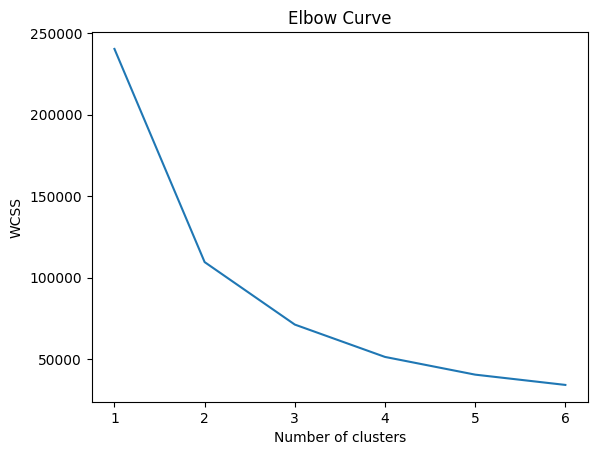

In [102]:
wcss=[]
for i in range(1,7):
    kmeans = KMeans(i)
    kmeans.fit(pca_X_train)
    wcss_iter = kmeans.inertia_
    wcss.append(wcss_iter)

number_clusters = range(1,7)
plt.rcdefaults()
plt.plot(number_clusters,wcss)
plt.title('Elbow Curve')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

From the above graph, it is evident that <span class="mark">number of clusters = 3 makes sense</span>

In [103]:
kmeans = KMeans(3)
kmeans.fit(pca_X_train, y_train)
identified_clusters = kmeans.fit_predict(pca_X_test)
identified_clusters = pd.DataFrame(identified_clusters, columns=['Cluster'])

In [104]:
identified_clusters

,Cluster
0,0
1,0
2,0
3,0
4,0
...,...
13091,2
13092,2
13093,2
13094,2


In [106]:
data_with_clusters = pca_X_test.copy()
data_with_clusters = pd.DataFrame(data_with_clusters, columns=['PCA1', 'PCA2'])
data_with_clusters['Cluster'] = identified_clusters['Cluster']

In [107]:
data_with_clusters['Cycle Time'] = df_train_Ori['Cycle Time']
data_with_clusters['unit number'] = df_train_Ori['unit number']

In [108]:
data_with_clusters['Health'] = create_cluster(data_with_clusters)

In [109]:
# check the centroids of each cluster
centroids = kmeans.cluster_centers_
centroids

array([[-3.36600399,  0.19999083],
       [-0.74757596, -0.60647823],
       [ 2.28638885, -0.52109717]])

In [110]:
data_with_clusters

,PCA1,PCA2,Cluster,Cycle Time,unit number,Health
0,-2.802156,-0.889513,0,1,1,Good
1,-3.837354,-0.137422,0,2,1,Good
2,-2.650266,-0.516381,0,3,1,Good
3,-3.153513,-0.895155,0,4,1,Good
4,-3.774481,-0.804817,0,5,1,Good
...,...,...,...,...,...,...
13091,2.455994,5.434567,2,175,66,Fail
13092,2.686031,4.901997,2,176,66,Fail
13093,2.423745,5.253607,2,177,66,Fail
13094,2.592755,5.466568,2,178,66,Fail


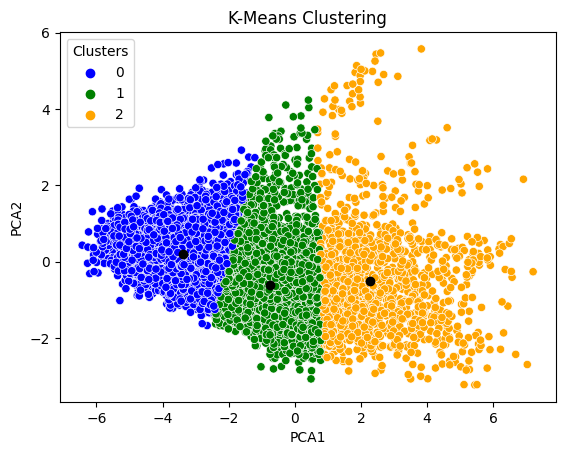

In [111]:
# plot the KMeans cluster with the Health category that is calculated
sns.scatterplot(x = 'PCA1', y='PCA2', data =data_with_clusters, hue='Cluster', palette=['blue', 'green', 'orange']).set(title="K-Means Clustering")
plt.scatter(kmeans.cluster_centers_[:,0] ,kmeans.cluster_centers_[:,1], color='black')
plt.legend(title='Clusters', loc='upper left')
plt.show()

### Inference

- The graph shows the cluster of three groups. <span class="mark">The dark black dot indicates the centroid of each cluster</span>

## Calculate Euclidean Distance to fail centroid

In [116]:
centroids[2]

array([ 2.28638885, -0.52109717])

In [120]:
from scipy.spatial import distance
datapoints = [data_with_clusters.PCA1[0], data_with_clusters.PCA2[0]]
fail_centroid = centroids[2]

In [121]:
index_list = list(range (0, len(data_with_clusters)))
fail_centroid = centroids[2]
eucledian_dist = []
for index in index_list:
    datapoints = [data_with_clusters.PCA1[index], data_with_clusters.PCA2[index]]
    eucledian_dist.append(distance.euclidean(datapoints, fail_centroid))
data_with_clusters['Euclidean Distance'] = eucledian_dist
data_with_clusters

,PCA1,PCA2,Cluster,Cycle Time,unit number,Health,Euclidean Distance
0,-2.802156,-0.889513,0,1,1,Good,5.101864
1,-3.837354,-0.137422,0,2,1,Good,6.135751
2,-2.650266,-0.516381,0,3,1,Good,4.936658
3,-3.153513,-0.895155,0,4,1,Good,5.452748
4,-3.774481,-0.804817,0,5,1,Good,6.067507
...,...,...,...,...,...,...,...
13091,2.455994,5.434567,2,175,66,Fail,5.958079
13092,2.686031,4.901997,2,176,66,Fail,5.437799
13093,2.423745,5.253607,2,177,66,Fail,5.776338
13094,2.592755,5.466568,2,178,66,Fail,5.995498


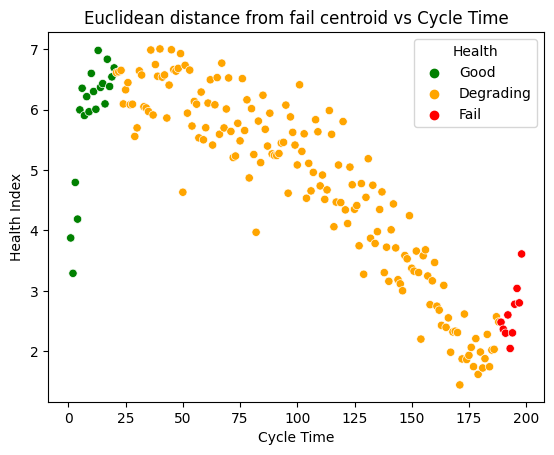

In [136]:
palette ={"Good": "green", "Degrading": "orange", "Fail": "red"}
sns.scatterplot(x = 'Cycle Time', y='Euclidean Distance', data =data_with_clusters[data_with_clusters['unit number'] == 50], hue='Health', palette=palette).set(title="Euclidean distance from fail centroid vs Cycle Time")
plt.legend(title='Health')
plt.ylabel("Health Index")
plt.show()

# Results

In [130]:
from tabulate import tabulate
print(tabulate(result_table, tablefmt="grid"))

+------+--------------------------+---------+-------+------+-------+
| S.No | Method                   | MSE     | RMSE  | MAPE | MAE   |
+------+--------------------------+---------+-------+------+-------+
| 1    | Linear Regression        | 1201.11 | 34.66 | 0.64 | 27.27 |
+------+--------------------------+---------+-------+------+-------+
| 2    | Random Forest Regression | 558.51  | 23.63 | 0.29 | 17.38 |
+------+--------------------------+---------+-------+------+-------+
| 3    | Decision Tree Regression | 582.63  | 24.14 | 0.33 | 18.45 |
+------+--------------------------+---------+-------+------+-------+
| 4    | SVR                      | 528.21  | 22.98 | 0.3  | 17.17 |
+------+--------------------------+---------+-------+------+-------+
| 5    | Lasso Regression         | 1104.82 | 33.24 | 0.83 | 28.02 |
+------+--------------------------+---------+-------+------+-------+
| 6    | KNN                      | 1145.75 | 33.85 | 0.35 | 22.99 |
+------+--------------------------